# Project 4: Regression Analysis

**Authors**
* Zhiyuan Chen, chen0error@g.ucla.edu, 605363281
* Ranjana Vittal, ranjanavittal@g.ucla.edu, 605629219
* Krish Kabra, krish97@g.ucla.edu, 404593821 

In [1]:
# Run once and restart runtime 
!pip install scikit-learn==0.24 #0.23.2 
!pip install https://github.com/kernc/scikit-optimize/archive/fix_sklearn.zip
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 
!pip install country_converter --upgrade
!pip install catboost
!pip install delayed

     |████████████████████████████████| 22.3MB 1.4MB/s 
  Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1
     - 747kB 4.2MB/s
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Using cached https://files.pythonhosted.org/packages/15/c4/1310a054d33abc318426a956e7d6df0df76a6ddfa9c66f6310274fb75d42/pyaml-20.4.0-py2.py3-none-any.whl
  Created wheel for scikit-optimize: filename=scikit_optimize-0.9.dev0-cp37-none-any.whl size=101937 sha256=afd835284289be34b1f7779e2d553766e0bac4aa73bb12a45d969b40c4c5d528
  Stored in directory: /tmp/pip-ephem-wheel-cache-nergdx_b/wheels/7f/7d/a6/e529f1d877e944d8bad7d2bf3e7089916dadbe92e89bd6b666
Successfully built scikit-optimize
     - 38.5MB 119.0MB/s
     |████████████████████████████████| 81kB 3.6MB/s 
     |████████████████████████████████| 1.1MB 9.1MB/s 
     |██████████

In [1]:
import sys, os
from time import time
import numpy as np
import matplotlib.pyplot as plt

runningOnColab = 'google.colab' in sys.modules
if runningOnColab:
  from google.colab import drive
  drive.mount('/content/drive', force_remount=True)
  # Please link EE 219 folder to your personal drive directory under the following path
  %cd '/content/drive/My Drive/Colab Notebooks/EE 219/Project 4' 
  %ls
  !pip freeze > requirements.txt

Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/13z517vur60HDVoYIHkYanSKA_W-dmNBG/EE 219/Project 4
Bike-Sharing-Dataset/  README.md            small_tree_suicide.dot
catboost_info/         requirements.txt     small_tree_v.dot
figures/               small_tree_bike.dot  Suicide-Rates-Dataset/
online_video_dataset/  small_tree_bike.png  tree.dot
Project4.ipynb         small_tree_s.dot     tree.png


## Data Inspection 

In [ ]:
import pandas as pd
from pandas_profiling import ProfileReport

### Bike Sharing Dataset


In [ ]:
bike_df = pd.read_csv('./Bike-Sharing-Dataset/day.csv')
bike_df["dteday"] = pd.to_datetime(bike_df["dteday"], errors="ignore")

profile = ProfileReport(bike_df, html={"style": {"full_width": True}})
profile.to_file("./figures/bike-profiling-report.html")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de

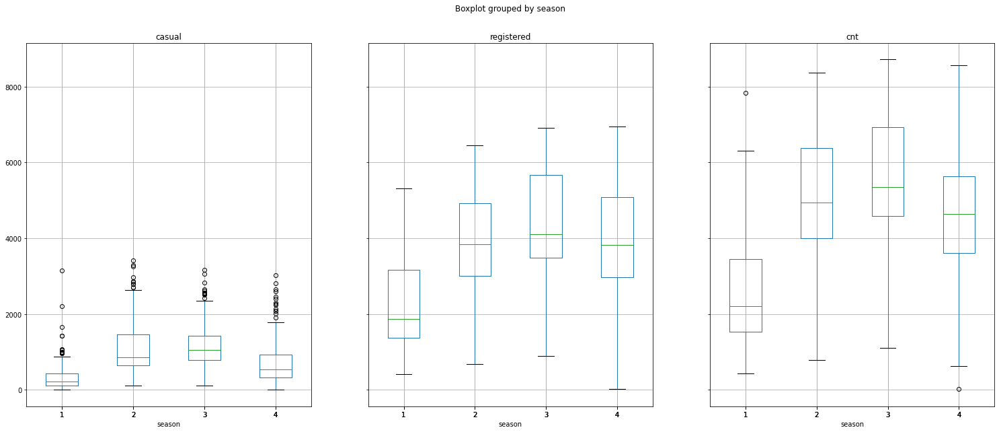

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de

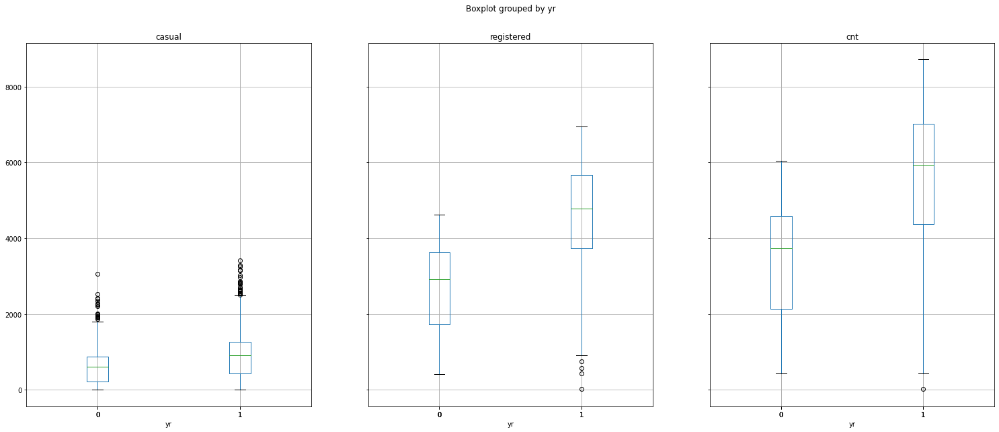

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de

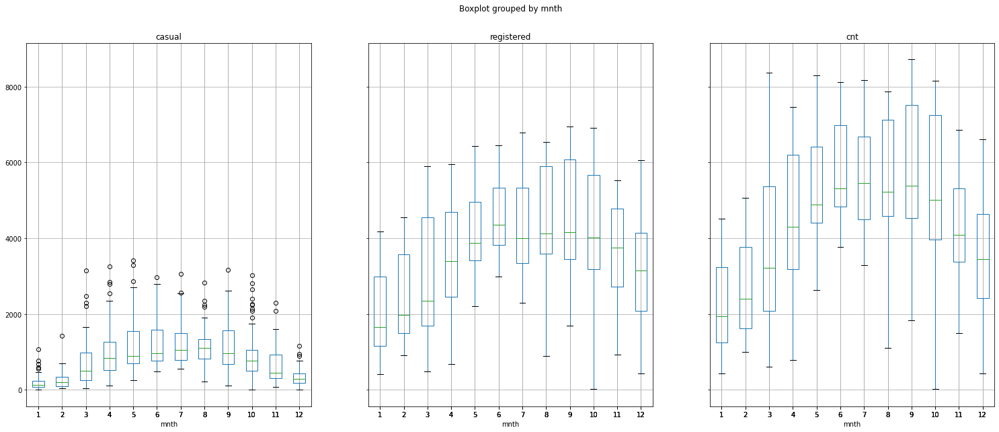

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de

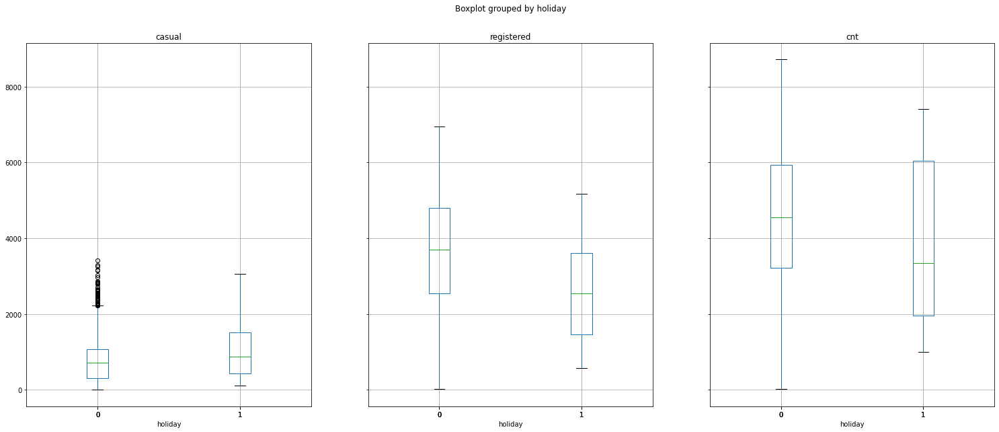

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de

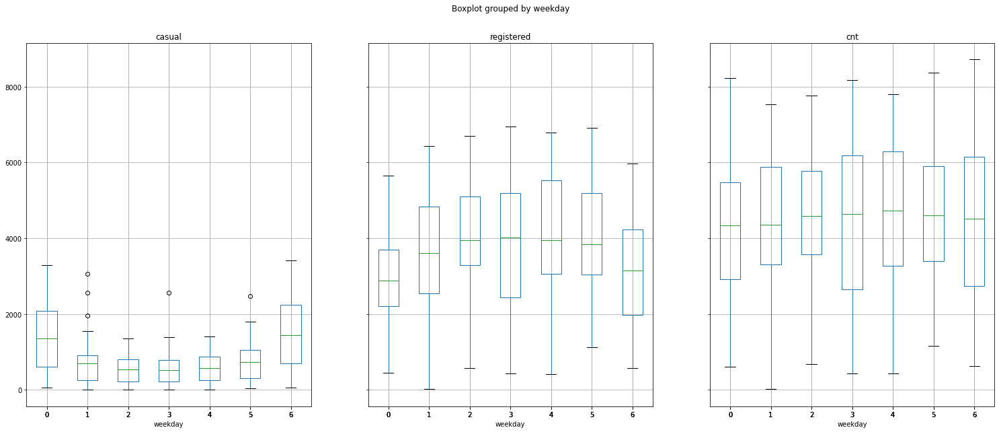

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de

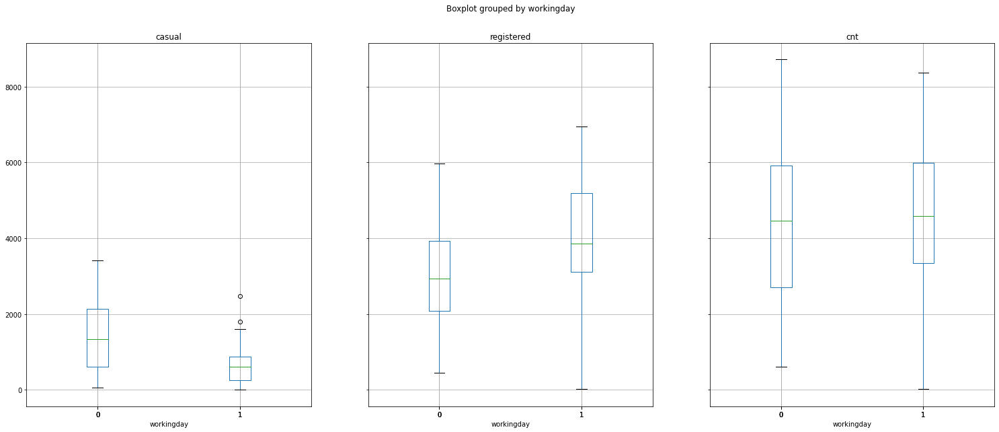

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de

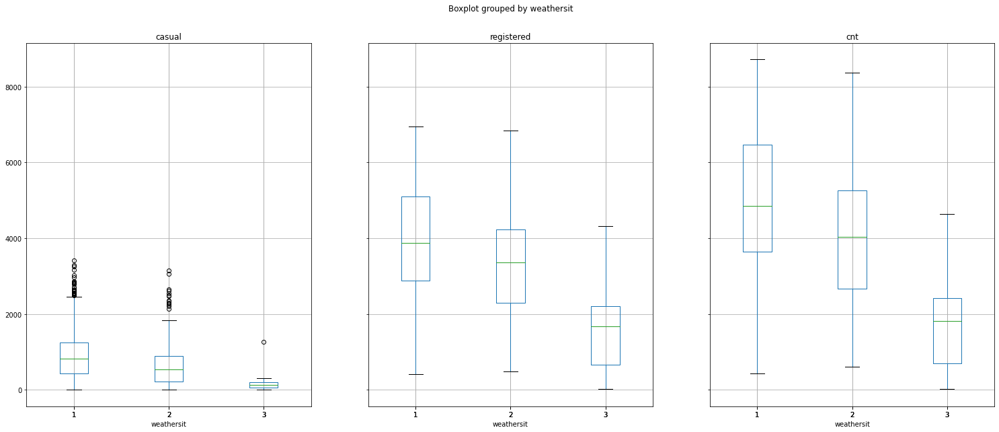

In [ ]:
# Box plot of categorical features vs target variable
categorical_features = ['season','yr','mnth','holiday','weekday','workingday','weathersit']
target_variables = ['casual','registered','cnt']

for category in categorical_features: 
  boxplot = bike_df.boxplot(column=target_variables,by=category,layout=(1,3),figsize=(25,10))
  plt.savefig(f'./figures/q3_bike_boxplot_{category}.png',)
  plt.show()

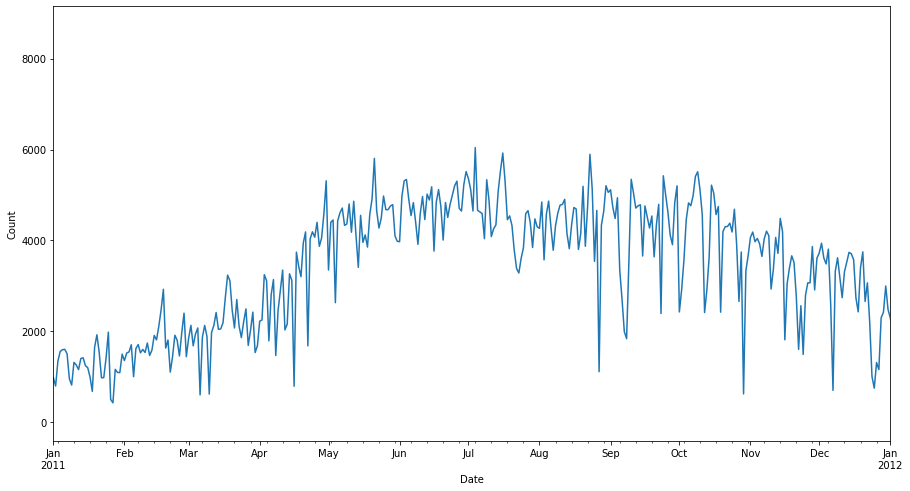

In [ ]:
# Plot the count number per day for a few months
ax = bike_df.plot(x='dteday', y='cnt',xlim=[pd.Timestamp('2011-01-01'),pd.Timestamp('2012-01-01')], 
                  legend=False, xlabel='Date', ylabel='Count',figsize=(15,8))
plt.savefig('./figures/q4_bike_countVsDay')

### Suicide Rates Overview 1985 to 2016

In [ ]:
suicide_df = pd.read_csv('./Suicide-Rates-Dataset/suicide-rates-dataset.csv')
suicide_df.drop(columns=['country-year','HDI for year'])
suicide_df[' gdp_for_year ($) '] = suicide_df[' gdp_for_year ($) '].str.replace(',','').astype(float)
profile = ProfileReport(suicide_df, html={"style": {"full_width": True}})
profile.to_file("./figures/suicide-profiling-report.html")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


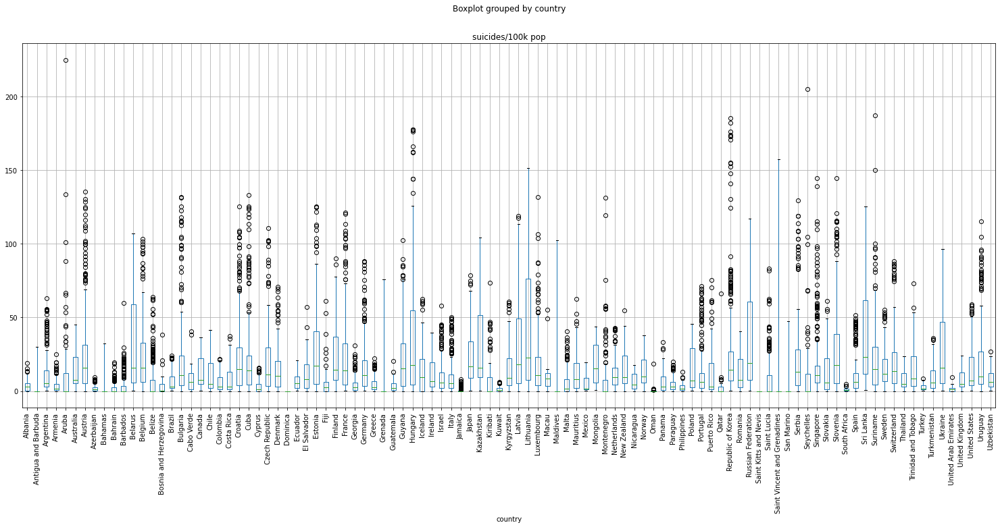

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


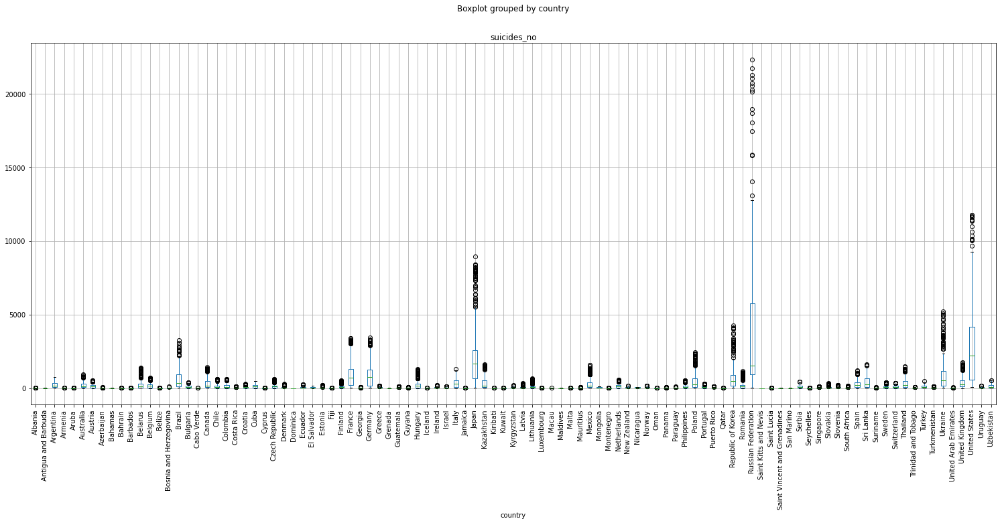

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


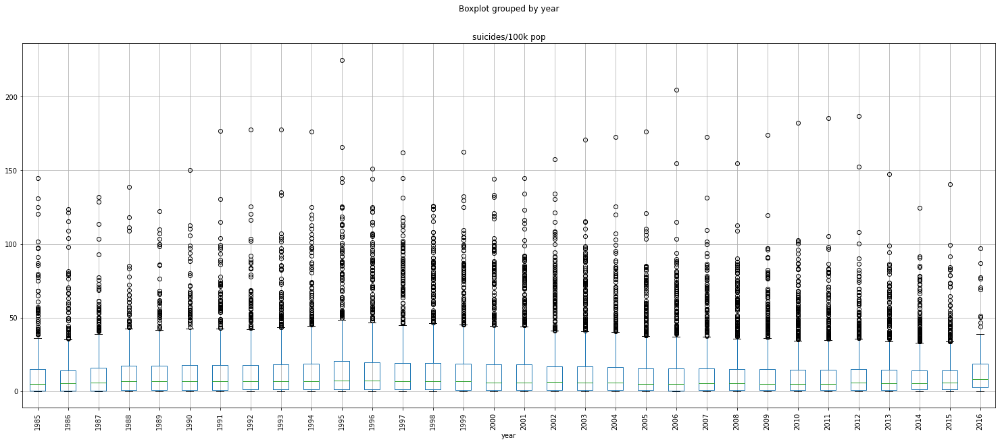

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


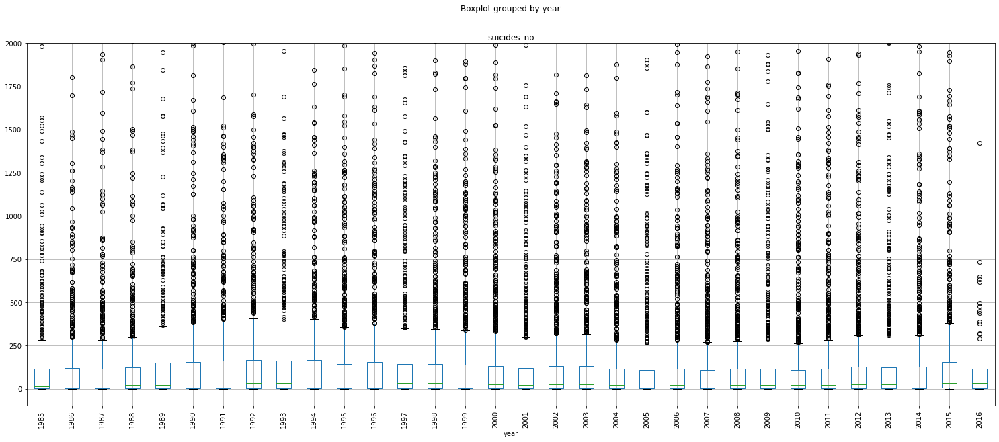

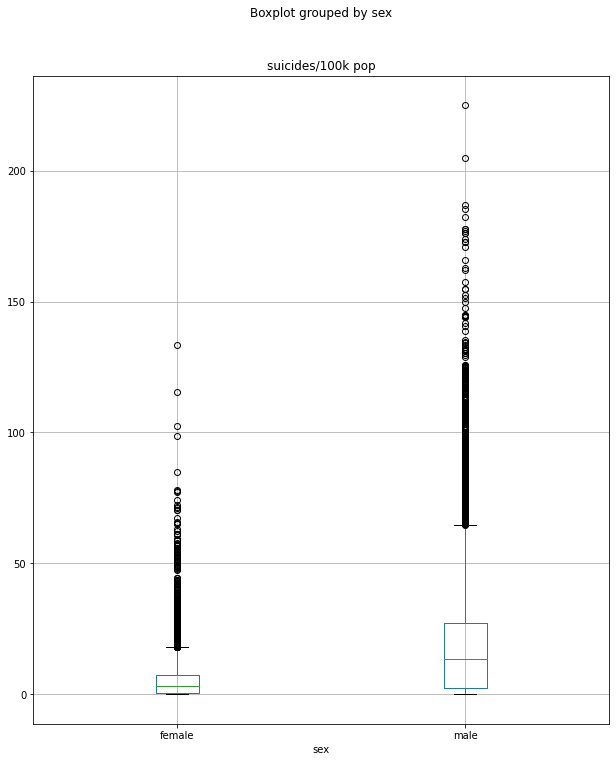

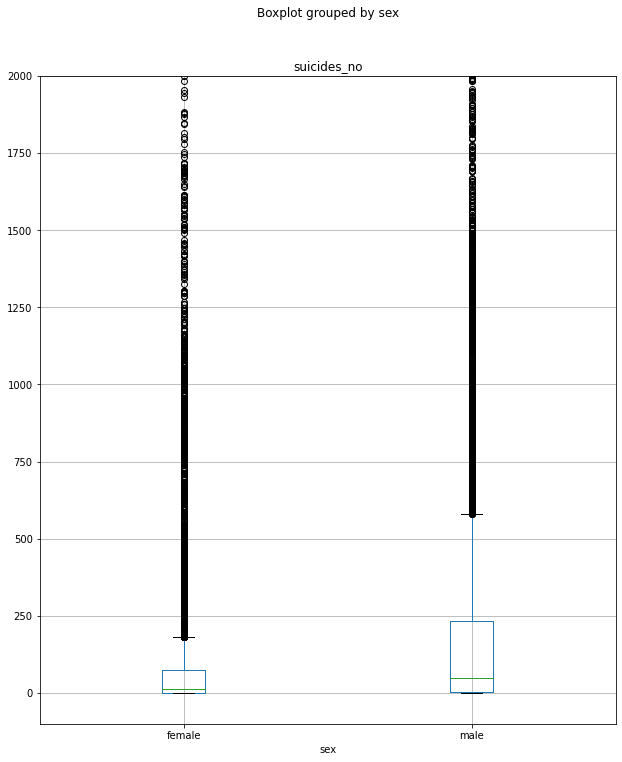

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


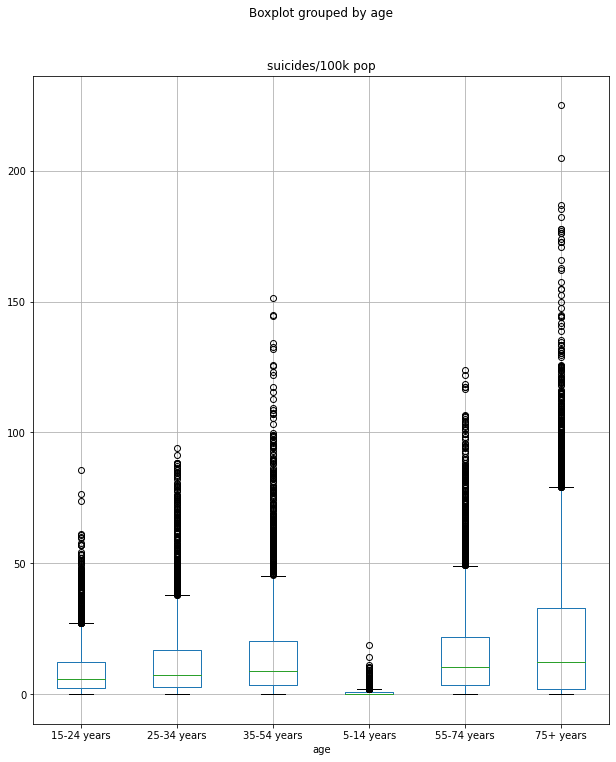

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


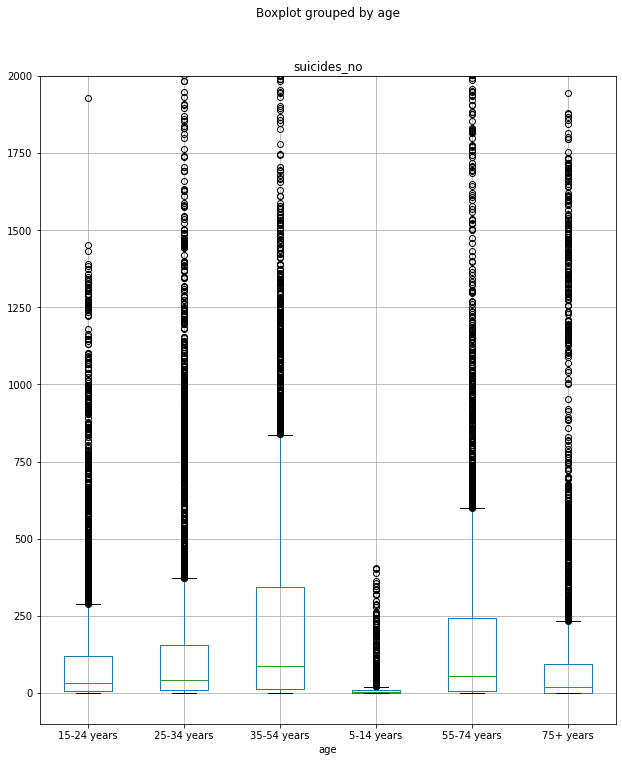

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


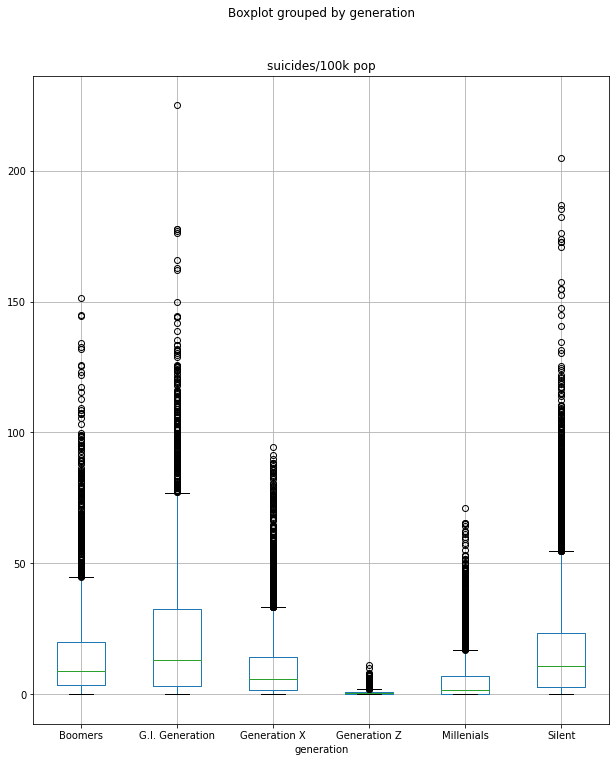

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


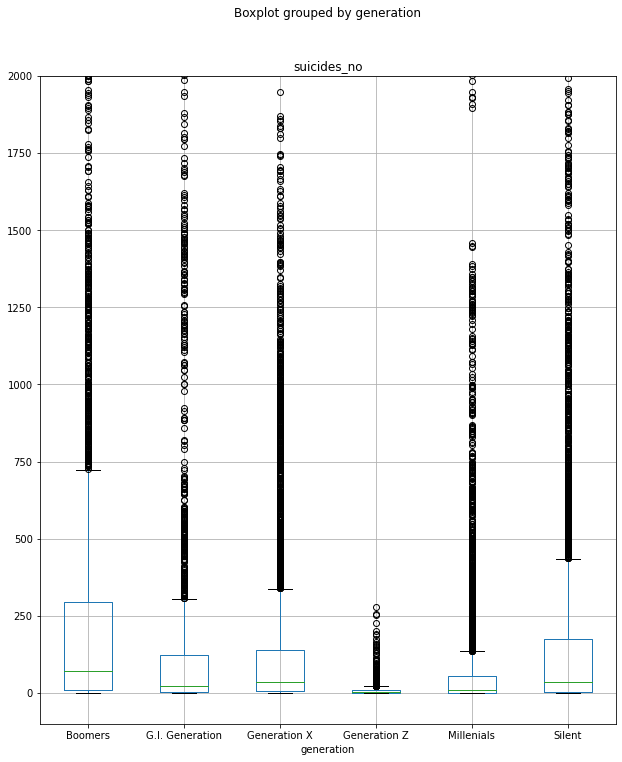

In [ ]:
# Box plot of categorical features vs target variable
categorical_features = ['country','year','sex','age','generation']
target_variables = ['suicides/100k pop','suicides_no']

for category in categorical_features:
  for target in target_variables:   
    if category in ['country','year']: 
      rot=90
      figsize=(25,10)
    else: 
      rot=0 
      figsize=(10,12)
    boxplot = suicide_df.boxplot(column=target,by=category,rot=rot,figsize=figsize,autorange=True)
    if target == 'suicides_no': 
      if category != 'country':
        boxplot.set_ylim(-100,2000)
    plt.savefig(f"./figures/q3_suicide_boxplot_{target.replace('/','_')}_{category}.png")
    plt.show()

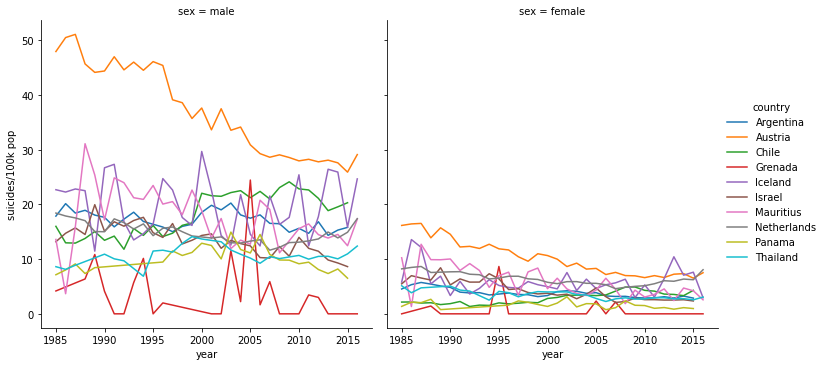

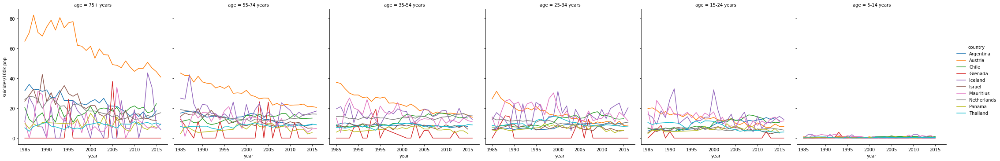

In [ ]:
import seaborn 

# Pick the top 10 countries that have the longest timespan of records
suicide_groupByCountry = suicide_df.groupby('country')
country_year_range = suicide_groupByCountry['year'].max() - suicide_groupByCountry['year'].min()
country_year_range = country_year_range.sort_values(ascending=False)
country_list = country_year_range.iloc[0:10].keys().to_list()
suicide_df_top10 = suicide_df[suicide_df["country"].isin(country_list)]

# Plot the suicide rate against time for different age groups and gender
seaborn.relplot(data=suicide_df_top10,x="year",y="suicides/100k pop",hue="country",col="sex",kind='line',ci=None)
plt.savefig('./figures/q5_suicide_rateVsTime_sex')
seaborn.relplot(data=suicide_df_top10,x="year",y="suicides/100k pop",hue="country",col="age",kind='line',ci=None)
plt.savefig('./figures/q5_suicide_rateVsTime_age')

### Video Transcoding Time Dataset

In [ ]:
video_df = pd.read_csv('./online_video_dataset/transcoding_mesurment.tsv',sep='\t')
profile = ProfileReport(video_df, html={"style": {"full_width": True}})
profile.to_file("./figures/video-profiling-report.html")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/35 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


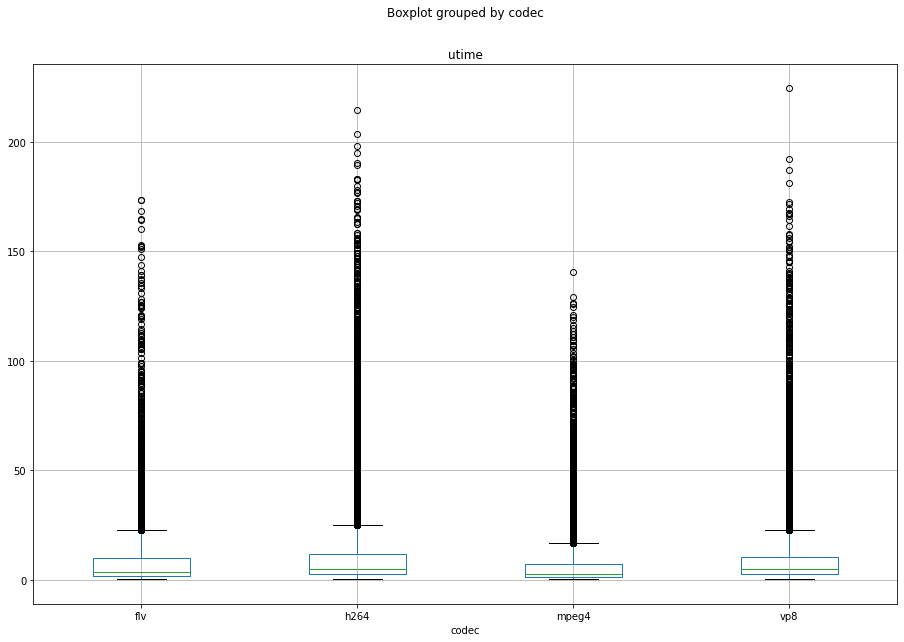

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


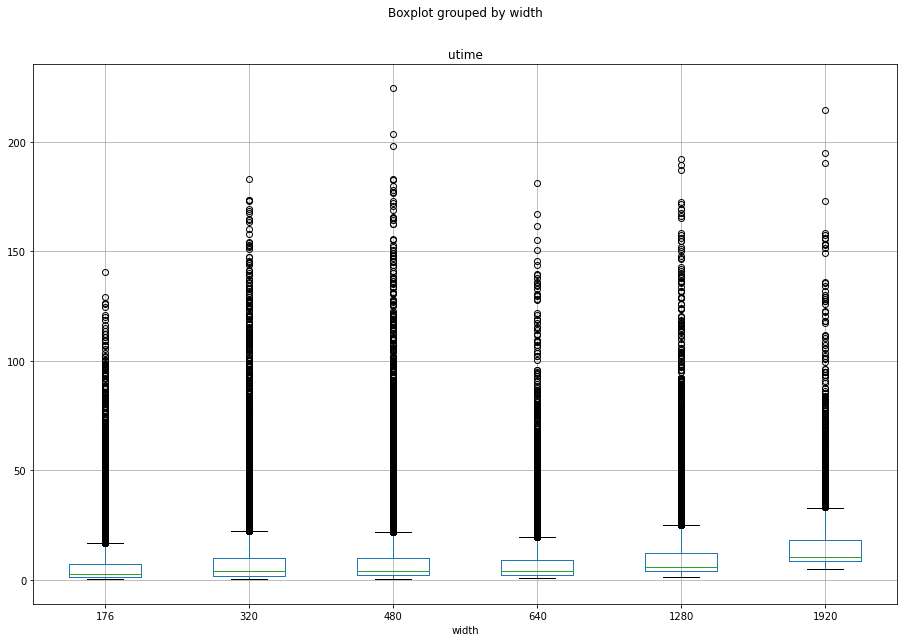

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


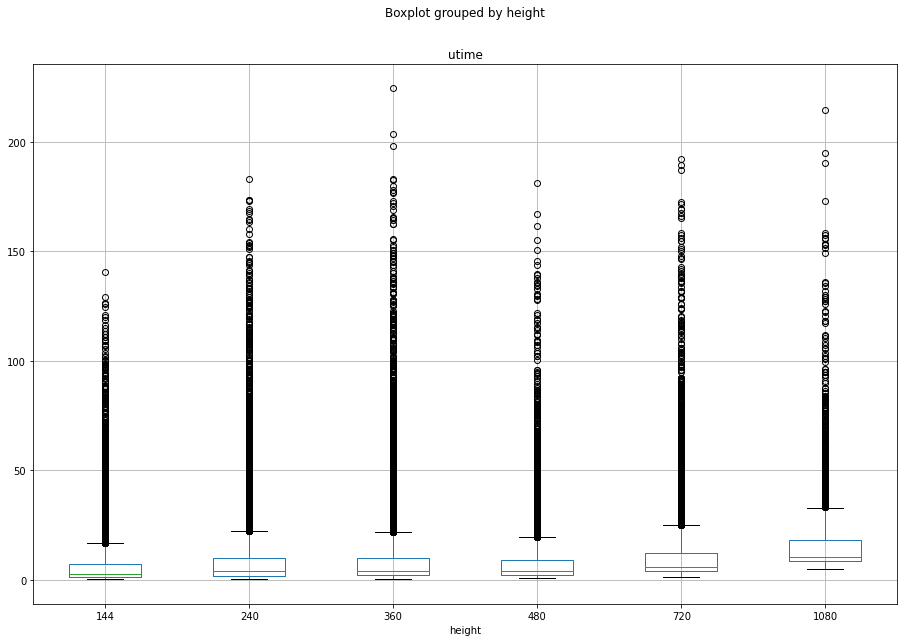

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


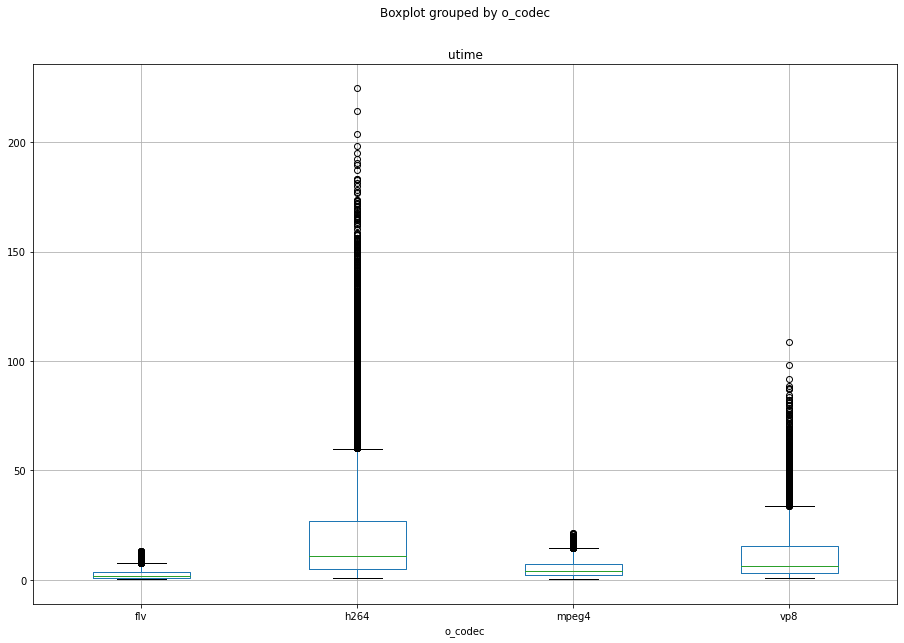

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


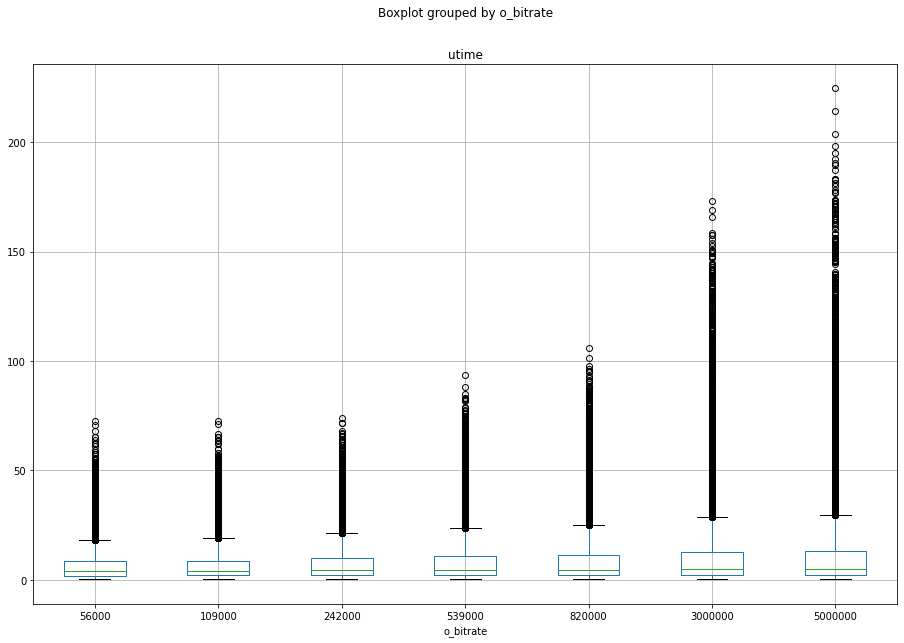

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


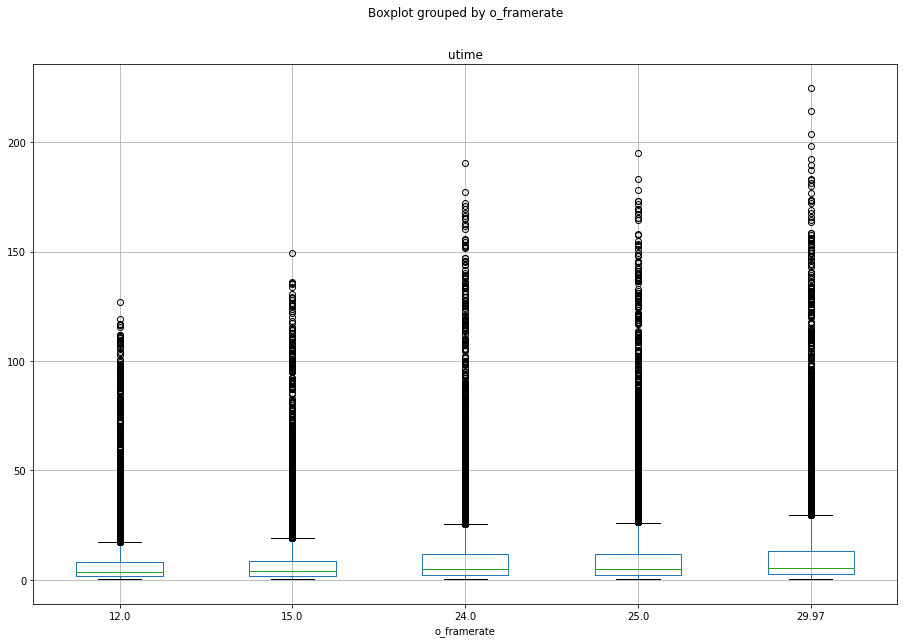

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


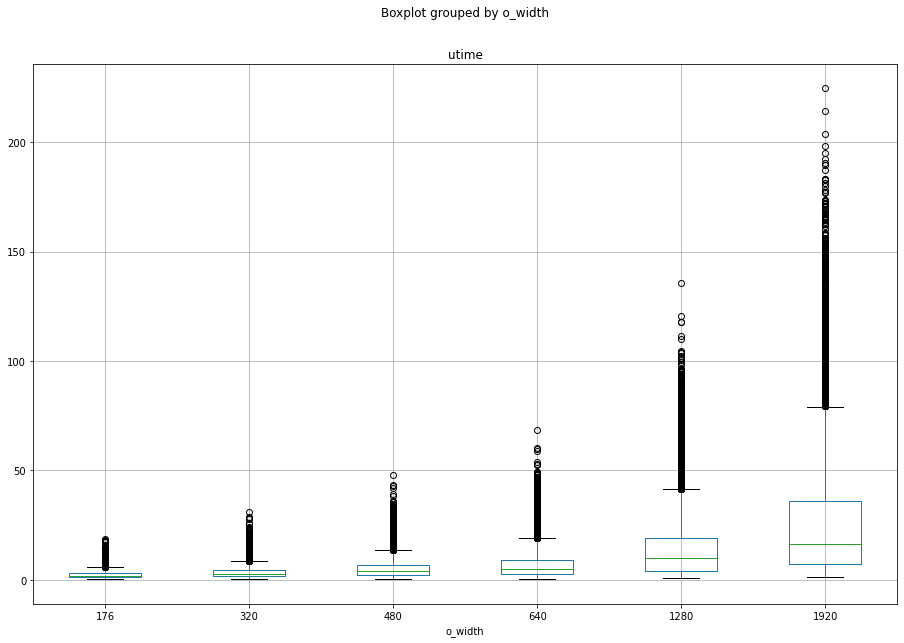

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


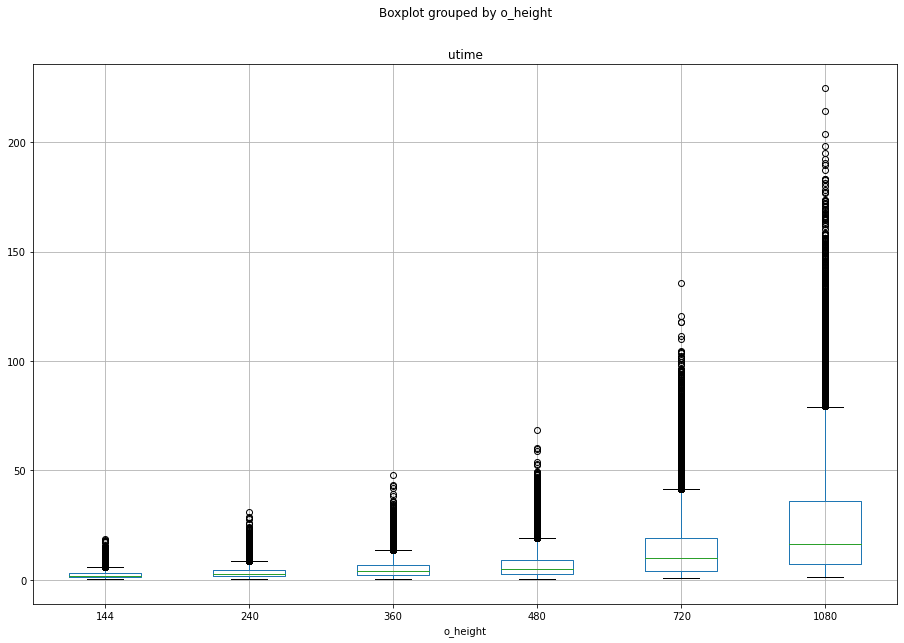

In [ ]:
# Box plot of categorical features vs target variable
categorical_features = ['codec','width','height','o_codec','o_bitrate','o_framerate','o_width','o_height']
target_variables = ['utime']

for category in categorical_features: 
  boxplot = video_df.boxplot(column=target_variables,by=category,figsize=(15,10),autorange=True)
  plt.savefig(f'./figures/q3_video_boxplot_{category}.png')
  plt.show()


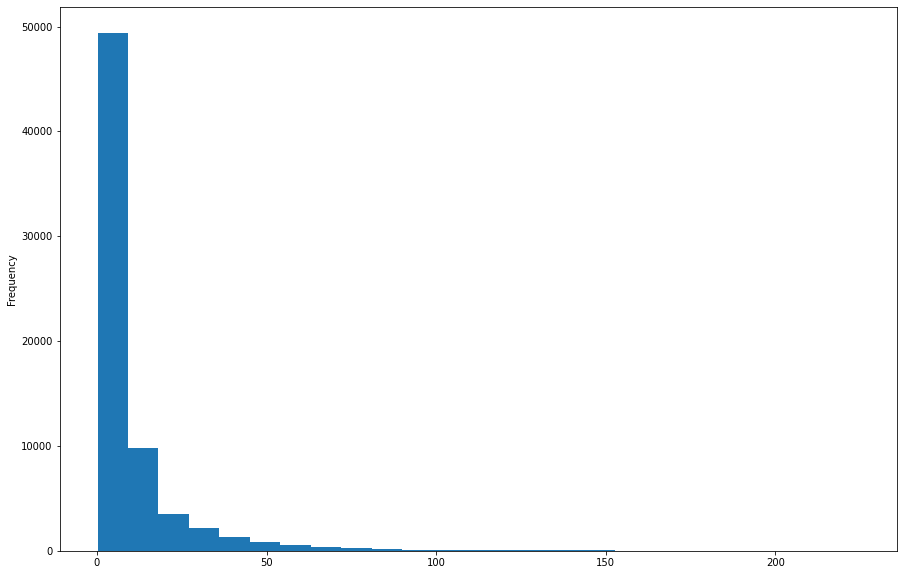

In [ ]:
# Plot the distribution of video transcoding times
ax = video_df['utime'].plot.hist(bins=25,figsize=(15,10),xlabel='utime')
plt.savefig(f'./figures/q6_video_transcoding_hist.png')

##  Handling Categorical Features & Standardization



In [2]:
import pandas as pd 
import country_converter as coco
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder 

# Bike sharing dataset
bike_df = pd.read_csv('./Bike-Sharing-Dataset/day.csv')
bike_df["dteday"] = pd.to_datetime(bike_df["dteday"], errors="ignore")

# Time features should be encoded depending on algorithm choice and results!
ordinal_features = ['yr','mnth','weekday','weathersit','season']
one_hot_features = ['holiday','workingday'] 
numerical_features = ['temp','atemp','hum','windspeed']
bike_features = numerical_features + ordinal_features + one_hot_features  

bike_preprocessing_pipeline = ColumnTransformer([
    ('numerical', StandardScaler(), numerical_features),
    ('ordinal', OrdinalEncoder(), ordinal_features), 
    ('one_hot', OneHotEncoder(drop='if_binary'), one_hot_features)
])

X_bike = bike_preprocessing_pipeline.fit_transform(bike_df[bike_features])
y_bike = bike_df["cnt"].values # total count 

print('Bike sharing dataset')
print(f'X shape: {X_bike.shape}')
print(f'y shape: {y_bike.shape}')

# Suicide rates overview dataset
suicide_df = pd.read_csv('./Suicide-Rates-Dataset/suicide-rates-dataset.csv')
suicide_df.drop(columns=['country-year','HDI for year'])
suicide_df[' gdp_for_year ($) '] = suicide_df[' gdp_for_year ($) '].str.replace(',','').astype(float)

# Remapping values  
cc = coco.CountryConverter()
country_names = np.unique(suicide_df['country'].values)
country_mapping_dict = {}
for country in country_names: 
  continent = cc.convert(country, to='continent')
  if continent in ['Asia','America']: 
    continent = cc.convert(country, to='UNregion')
  country_mapping_dict[country] = continent
    
suicide_df['country'] = suicide_df['country'].replace(to_replace=country_mapping_dict)
suicide_df['age'] = suicide_df['age'].replace(to_replace={'5-14 years':1,'15-24 years':2,'25-34 years':3,'35-54 years':4,'55-74 years':5,'75+ years':6})
suicide_df['generation'] = suicide_df['generation'].replace(to_replace={None:0,'G.I. Generation':1,'Silent':2,'Boomers':3,'Generation X':4,'Millenials':5,'Generation Z':6})

# Time features should be encoded depending on algorithm choice and results!
ordinal_features = ['year','age','generation']
one_hot_features = ['sex','country']
numerical_features = ['population',' gdp_for_year ($) ','gdp_per_capita ($)']
suicide_features = numerical_features + ordinal_features + one_hot_features  

suicide_preprocessing_pipeline = ColumnTransformer([
    ('numerical', StandardScaler(), numerical_features),
    ('ordinal', OrdinalEncoder(), ordinal_features), 
    ('one_hot', OneHotEncoder(drop='if_binary'), one_hot_features)
])

X_suicide = suicide_preprocessing_pipeline.fit_transform(suicide_df[suicide_features])
y_suicide = suicide_df["suicides/100k pop"].values # suicide rate (suicides/100k pop)

print('Suicide rates dataset')
print(f'X shape: {X_suicide.shape}')
print(f'y shape: {y_suicide.shape}')

# Video transcoding time dataset
video_df = pd.read_csv('./online_video_dataset/transcoding_mesurment.tsv',sep='\t')

ordinal_features = ['width','height','o_width','o_height']
one_hot_features = ['codec','o_codec']
numerical_features = ['duration','bitrate','frames','framerate',
                      'i','p','b','i_size','p_size','size',
                      'o_bitrate','o_framerate']
video_features = numerical_features + ordinal_features + one_hot_features  

video_preprocessing_pipeline = ColumnTransformer([
    ('numerical', StandardScaler(), numerical_features),
    ('ordinal', OrdinalEncoder(), ordinal_features),
    ('one_hot', OneHotEncoder(drop='if_binary'), one_hot_features),
])

X_video = video_preprocessing_pipeline.fit_transform(video_df[video_features])
y_video = video_df["utime"].values # total count 

print('Video transcoding dataset')
print(f'X shape: {X_video.shape}')
print(f'y shape: {y_video.shape}')

Bike sharing dataset
X shape: (731, 11)
y shape: (731,)
Suicide rates dataset
X shape: (27820, 19)
y shape: (27820,)
Video transcoding dataset
X shape: (68784, 24)
y shape: (68784,)


## Feature Selection

-------------------------
Bike sharing dataset
Feature 		 F-score 		 MI
temp 		 473.47171053497703 		 0.32762303530803116
atemp 		 482.4543105289903 		 0.40446252922956205
hum 		 7.46193999634535 		 0.09967915892084189
windspeed 		 42.437841593463475 		 0.06615481105111254
yr 		 344.8905855356845 		 0.28052260686212915
mnth 		 62.004624548332224 		 0.3779422181653551
weekday 		 3.331091365174596 		 0.04587897434217547
weathersit 		 70.7292978292076 		 0.06821181429671608
season 		 143.9676525909185 		 0.2172488223978708
holiday 		 3.421441039972207 		 0.011022088841459832
workingday 		 2.7367422831912496 		 0.022877158480664184


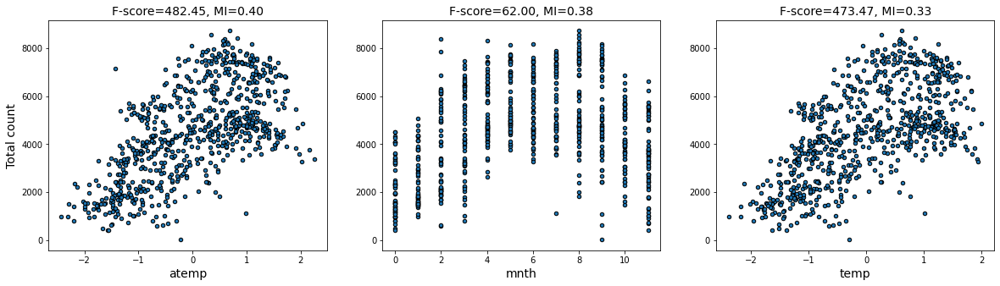

-------------------------
Suicide rates dataset
Feature 		 F-score 		 MI
population 		 1.909580251300788 		 0.35231761033198694
 gdp_for_year ($)  		 17.732464197730646 		 0.34273668231425347
gdp_per_capita ($) 		 0.08864797749177898 		 0.32997456269211867
year 		 42.45575553449209 		 0.0
age 		 4210.793838223362 		 0.27269075534527154
generation 		 3530.554883117733 		 0.14920460432528992
sex 		 5035.427899106153 		 0.140818925839441


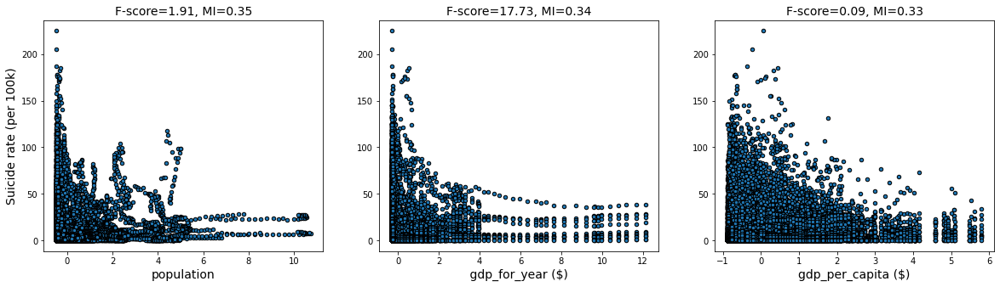

-------------------------
Video transcoding dataset
Feature 		 F-score 		 MI
duration 		 2.1053989872457146 		 0.3421980726815983
bitrate 		 1697.6446721194739 		 0.3425218941237995
frames 		 75.50745421950923 		 0.3417690813881551
framerate 		 435.6708959426289 		 0.1930451456999691
i 		 23.521143697015813 		 0.30708423705578536
p 		 75.90071258286414 		 0.3425463324411986
b 		 1.8169109847941567 		 0.0025506849257002084
i_size 		 289.241036227849 		 0.3423915467672174
p_size 		 662.1102054976559 		 0.3423915467672174
size 		 654.6205699213642 		 0.3423915467672174
o_bitrate 		 1703.902785174879 		 0.020624968154697054
o_framerate 		 752.7024732737266 		 0.014036495537939064
width 		 927.6365410418391 		 0.14837994368412755
height 		 927.6365410418391 		 0.1480486618060377
o_width 		 20207.14880337625 		 0.3136743831406581
o_height 		 20207.14880337625 		 0.3128506005762417


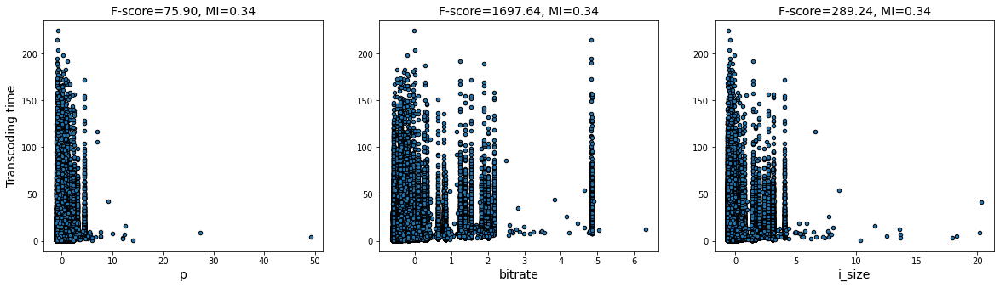

In [ ]:
# REQUIRES SCIKIT-LEARN >= 0.24
from sklearn.feature_selection import SelectKBest, mutual_info_regression, f_regression

print('-------------------------')
print('Bike sharing dataset')

f_score, _ = f_regression(X_bike, y_bike)
discrete_features = np.zeros(X_bike.shape[1])
discrete_features[0:len(bike_preprocessing_pipeline.transformers[0][2])] = 1 # Numerical features are at the start
mi = mutual_info_regression(X_bike, y_bike, discrete_features=discrete_features.astype('bool_'))

print("Feature \t\t F-score \t\t MI")
for i,feature in enumerate(bike_features): 
  print(f"{feature} \t\t {f_score[i]} \t\t {mi[i]}")

mi_argsort = np.flip(np.argsort(mi))

plt.figure(figsize=(20, 5))
for i,indx in enumerate(mi_argsort[0:3]):
    feature = bike_features[indx]
    plt.subplot(1, 3, i + 1)
    plt.scatter(X_bike[:, indx], y_bike, edgecolor='black', s=20)
    plt.xlabel(f"{feature}", fontsize=14)
    if i == 0:
        plt.ylabel("Total count", fontsize=14)
    plt.title("F-score={:.2f}, MI={:.2f}".format(f_score[indx], mi[indx]),
              fontsize=14)
plt.savefig('./figures/q9_bike_features_scatter.png')
plt.show()

X_bike_best = SelectKBest(f_regression,k=8).fit_transform(X_bike, y_bike)

print('-------------------------')
print('Suicide rates dataset')

f_score, _ = f_regression(X_suicide, y_suicide)
discrete_features = np.zeros(X_suicide.shape[1])
discrete_features[0:len(suicide_preprocessing_pipeline.transformers[0][2])] = 1 # Numerical features are at the start
mi = mutual_info_regression(X_suicide, y_suicide, discrete_features=discrete_features.astype('bool_'))

print("Feature \t\t F-score \t\t MI")
for i,feature in enumerate(suicide_features): 
  if feature == 'country': 
    break
  print(f"{feature} \t\t {f_score[i]} \t\t {mi[i]}")

mi_argsort = np.flip(np.argsort(mi))

plt.figure(figsize=(20, 5))
for i,indx in enumerate(mi_argsort[0:3]):
    feature = suicide_features[indx]
    plt.subplot(1, 3, i + 1)
    plt.scatter(X_suicide[:, indx], y_suicide, edgecolor='black', s=20)
    plt.xlabel(f"{feature}", fontsize=14)
    if i == 0:
        plt.ylabel("Suicide rate (per 100k)", fontsize=14)
    plt.title("F-score={:.2f}, MI={:.2f}".format(f_score[indx], mi[indx]),
              fontsize=14)
plt.savefig('./figures/q9_suicide_features_scatter.png')
plt.show()

X_suicide_best = SelectKBest(f_regression,k=12).fit_transform(X_suicide, y_suicide)

print('-------------------------')
print('Video transcoding dataset')

f_score, _ = f_regression(X_video, y_video)
discrete_features = np.zeros(X_video.shape[1])
discrete_features[0:len(video_preprocessing_pipeline.transformers[0][2])] = 1 # Numerical features are at the start
mi = mutual_info_regression(X_video, y_video, discrete_features=discrete_features.astype('bool_'))

print("Feature \t\t F-score \t\t MI")
for i,feature in enumerate(video_features): 
  if feature == 'codec': 
    break
  print(f"{feature} \t\t {f_score[i]} \t\t {mi[i]}")

mi_argsort = np.flip(np.argsort(mi))

plt.figure(figsize=(20, 5))
for i,indx in enumerate(mi_argsort[0:3]):
    feature = video_features[indx]
    plt.subplot(1, 3, i + 1)
    plt.scatter(X_video[:, indx], y_video, edgecolor='black', s=20)
    plt.xlabel(f"{feature}", fontsize=14)
    if i == 0:
        plt.ylabel("Transcoding time", fontsize=14)
    plt.title("F-score={:.2f}, MI={:.2f}".format(f_score[indx], mi[indx]),
              fontsize=14)
plt.savefig('./figures/q9_video_features_scatter.png')
plt.show()

X_video_best = SelectKBest(f_regression,k=12).fit_transform(X_video, y_video)

## Linear Regression

Questions 10-13

Bike Dataset

In [ ]:
from sklearn import preprocessing
from sklearn.feature_selection import mutual_info_regression, f_regression

MutualInfo_bike = mutual_info_regression(X_bike,y_bike)
Fscore_bike = f_regression(X_bike,y_bike)

top5_MI_bike = np.argsort(MutualInfo_bike)[::-1][:5]
top5_FS_bike = np.argsort(Fscore_bike[0])[::-1][:5]

Bike_top5_MI = X_bike[:, top5_MI_bike]
Bike_top5_FS = X_bike[:, top5_FS_bike]

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LinearRegression

pipe_lr_standard = Pipeline([
    ('standardize', preprocessing.StandardScaler()),
    ('model', LinearRegression())
])

pipe_lr_nonstandard = Pipeline([
    ('model', LinearRegression())
])

lr_train_score = []
lr_test_score = []
xs = [Bike_top5_MI, Bike_top5_FS]

for x in xs:
    cv_results = cross_validate(pipe_lr_nonstandard, x, y_bike, scoring='neg_root_mean_squared_error', 
                                return_train_score=True, cv=10)
    lr_train_score.append(np.mean(cv_results['train_score']))
    lr_test_score.append(np.mean(cv_results['test_score']))
    cv_results = cross_validate(pipe_lr_standard, x, y_bike, scoring='neg_root_mean_squared_error', 
                                return_train_score=True, cv=10)
    lr_train_score.append(np.mean(cv_results['train_score']))
    lr_test_score.append(np.mean(cv_results['test_score']))

In [ ]:
lr_results = pd.DataFrame(data={'mean_test_score': lr_test_score, 'mean_train_score': lr_train_score,
                                'param_model': 'LinearRegression()', 'param_model__alpha': 'NA', 
                                'Standardize': [False, True, False, True], 
                                'Feature Selection': ['Mutual Information', 'Mutual Information', 'F Scores', 'F Scores']})

In [ ]:
lr_results

,mean_test_score,mean_train_score,param_model,param_model__alpha,Standardize,Feature Selection
0,-1075.046936,-990.209271,LinearRegression(),NA,False,Mutual Information
1,-1075.046936,-990.209271,LinearRegression(),NA,True,Mutual Information
2,-971.893149,-905.897288,LinearRegression(),NA,False,F Scores
3,-971.893149,-905.897288,LinearRegression(),NA,True,F Scores


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression, Ridge, Lasso

pipe_standard = Pipeline([
    ('standardize', preprocessing.StandardScaler()),
    ('model', LinearRegression())
])

pipe_nonstandard = Pipeline([
    ('model', LinearRegression())
])

param_grid = {
    'model': [Ridge(random_state=42, max_iter=10000), Lasso(random_state=42, max_iter=10000)],
    'model__alpha': [10.0**x for x in np.arange(-3,4)]
}

In [ ]:
grid1 = GridSearchCV(pipe_nonstandard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Bike_top5_MI, y_bike)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
grid2 = GridSearchCV(pipe_nonstandard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Bike_top5_FS, y_bike)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
grid3 = GridSearchCV(pipe_standard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Bike_top5_MI, y_bike)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
grid4 = GridSearchCV(pipe_standard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Bike_top5_FS, y_bike)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
lr_reg_result1 = pd.DataFrame(grid1.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result1['Standardize'] = False
lr_reg_result1['Feature Selection'] = 'Mutual Information'

lr_reg_result2 = pd.DataFrame(grid2.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result2['Standardize'] = False
lr_reg_result2['Feature Selection'] = 'F Scores'

lr_reg_result3 = pd.DataFrame(grid3.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result3['Standardize'] = True
lr_reg_result3['Feature Selection'] = 'Mutual Information'

lr_reg_result4 = pd.DataFrame(grid4.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result4['Standardize'] = True
lr_reg_result4['Feature Selection'] = 'F Scores'

In [ ]:
results = pd.concat([lr_results, lr_reg_result1, lr_reg_result2, lr_reg_result3, lr_reg_result4])
results = results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
results

,mean_test_score,mean_train_score,param_model,param_model__alpha,Standardize,Feature Selection
0,-957.562714,-908.643016,"Ridge(alpha=10.0, max_iter=10000, random_state...",10,False,F Scores
1,-960.244150,-906.609171,"Ridge(alpha=10.0, max_iter=10000, random_state...",10,True,F Scores
2,-963.061829,-906.522603,"Lasso(alpha=100.0, max_iter=10000, random_stat...",10,False,F Scores
3,-964.043480,-906.245211,"Lasso(alpha=100.0, max_iter=10000, random_stat...",10,True,F Scores
4,-966.719134,-905.978825,"Ridge(alpha=10.0, max_iter=10000, random_state...",1,False,F Scores
5,-967.279650,-905.957106,"Ridge(alpha=10.0, max_iter=10000, random_state...",1,True,F Scores
6,-968.028970,-905.935376,"Lasso(alpha=100.0, max_iter=10000, random_stat...",1,False,F Scores
7,-968.162166,-905.932865,"Lasso(alpha=100.0, max_iter=10000, random_stat...",1,True,F Scores
8,-968.622795,-921.718077,"Ridge(alpha=10.0, max_iter=10000, random_state...",100,True,F Scores
9,-971.158561,-905.898555,"Ridge(alpha=10.0, max_iter=10000, random_state...",0.1,False,F Scores


In [ ]:
import statsmodels.api as sm
 
lm_fit = sm.OLS(y_bike, sm.add_constant(X_bike)).fit()
print(lm_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     261.9
Date:                Sun, 21 Mar 2021   Prob (F-statistic):          7.80e-243
Time:                        17:08:01   Log-Likelihood:                -5981.0
No. Observations:                 731   AIC:                         1.199e+04
Df Residuals:                     719   BIC:                         1.204e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2901.9840    103.114     28.143      0.0

In [ ]:
lm_fit.pvalues

array([4.52761091e-118, 1.48771129e-001, 2.48651748e-002, 1.22959914e-003,
       2.96410238e-008, 2.11225026e-136, 2.27628139e-002, 2.55764466e-005,
       2.23116348e-014, 1.52390630e-019, 1.00331512e-002, 9.50670612e-002])

Suicide Dataset

In [ ]:
from sklearn import preprocessing
from sklearn.feature_selection import mutual_info_regression, f_regression

MutualInfo_suicide = mutual_info_regression(X_suicide,y_suicide)
Fscore_suicide = f_regression(X_suicide,y_suicide)

top5_MI_suicide = np.argsort(MutualInfo_suicide)[::-1][:5]
top5_FS_suicide = np.argsort(Fscore_suicide[0])[::-1][:5]

Suicide_top5_MI = X_suicide[:, top5_MI_suicide]
Suicide_top5_FS = X_suicide[:, top5_FS_suicide]

In [ ]:
from sklearn.pipeline import Pipeline #
from sklearn import preprocessing
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LinearRegression

pipe_lr_standard = Pipeline([
    ('standardize', preprocessing.StandardScaler()),
    ('model', LinearRegression())
])

pipe_lr_nonstandard = Pipeline([
    ('model', LinearRegression())
])

lr_train_score = []
lr_test_score = []
xs = [Suicide_top5_MI, Suicide_top5_FS]

for x in xs:
    cv_results = cross_validate(pipe_lr_nonstandard, x, y_suicide, scoring='neg_root_mean_squared_error', 
                                return_train_score=True, cv=10)
    lr_train_score.append(np.mean(cv_results['train_score']))
    lr_test_score.append(np.mean(cv_results['test_score']))
    cv_results = cross_validate(pipe_lr_standard, x, y_suicide, scoring='neg_root_mean_squared_error', 
                                return_train_score=True, cv=10)
    lr_train_score.append(np.mean(cv_results['train_score']))
    lr_test_score.append(np.mean(cv_results['test_score']))

In [ ]:
lr_results = pd.DataFrame(data={'mean_test_score': lr_test_score, 'mean_train_score': lr_train_score,
                                'param_model': 'LinearRegression()', 'param_model__alpha': 'NA', 
                                'Standardize': [False, True, False, True], 
                                'Feature Selection': ['Mutual Information', 'Mutual Information', 'F Scores', 'F Scores']})

In [ ]:
lr_results

,mean_test_score,mean_train_score,param_model,param_model__alpha,Standardize,Feature Selection
0,-17.697450,-17.645069,LinearRegression(),NA,False,Mutual Information
1,-17.697450,-17.645069,LinearRegression(),NA,True,Mutual Information
2,-15.294124,-15.436013,LinearRegression(),NA,False,F Scores
3,-15.294124,-15.436013,LinearRegression(),NA,True,F Scores


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression, Ridge, Lasso

pipe_standard = Pipeline([
    ('standardize', preprocessing.StandardScaler()),
    ('model', LinearRegression())
])

pipe_nonstandard = Pipeline([
    ('model', LinearRegression())
])

param_grid = {
    'model': [Ridge(random_state=42, max_iter=10000), Lasso(random_state=42, max_iter=10000)],
    'model__alpha': [10.0**x for x in np.arange(-3,4)]
}

In [ ]:
grid1 = GridSearchCV(pipe_nonstandard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Suicide_top5_MI, y_suicide)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
grid2 = GridSearchCV(pipe_nonstandard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Suicide_top5_FS, y_suicide)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
grid3 = GridSearchCV(pipe_standard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Suicide_top5_FS, y_suicide)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
grid4 = GridSearchCV(pipe_standard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Suicide_top5_FS, y_suicide)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
lr_reg_result1 = pd.DataFrame(grid1.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result1['Standardize'] = False
lr_reg_result1['Feature Selection'] = 'Mutual Information'

lr_reg_result2 = pd.DataFrame(grid2.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result2['Standardize'] = False
lr_reg_result2['Feature Selection'] = 'F Scores'

lr_reg_result3 = pd.DataFrame(grid3.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result3['Standardize'] = True
lr_reg_result3['Feature Selection'] = 'Mutual Information'

lr_reg_result4 = pd.DataFrame(grid4.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result4['Standardize'] = True
lr_reg_result4['Feature Selection'] = 'F Scores'

In [ ]:
results = pd.concat([lr_results, lr_reg_result1, lr_reg_result2, lr_reg_result3, lr_reg_result4])
results = results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
results

,mean_test_score,mean_train_score,param_model,param_model__alpha,Standardize,Feature Selection
0,-15.288837,-15.444549,"Ridge(alpha=1000.0, max_iter=10000, random_sta...",1000,True,Mutual Information
1,-15.288837,-15.444549,"Ridge(alpha=1000.0, max_iter=10000, random_sta...",1000,True,F Scores
2,-15.291321,-15.436819,"Ridge(alpha=1000.0, max_iter=10000, random_sta...",100,False,F Scores
3,-15.291800,-15.437192,"Lasso(max_iter=10000, random_state=42)",0.1,True,F Scores
4,-15.291800,-15.437192,"Lasso(max_iter=10000, random_state=42)",0.1,True,Mutual Information
5,-15.292646,-15.436144,"Ridge(alpha=1000.0, max_iter=10000, random_sta...",100,True,F Scores
6,-15.292646,-15.436144,"Ridge(alpha=1000.0, max_iter=10000, random_sta...",100,True,Mutual Information
7,-15.293752,-15.436077,"Lasso(max_iter=10000, random_state=42)",0.01,False,F Scores
8,-15.293756,-15.436022,"Ridge(alpha=1000.0, max_iter=10000, random_sta...",10,False,F Scores
9,-15.293800,-15.436025,"Lasso(max_iter=10000, random_state=42)",0.01,True,F Scores


In [ ]:
import statsmodels.api as sm
 
lm_fit = sm.OLS(y_suicide, sm.add_constant(X_suicide)).fit()
print(lm_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.371
Model:                            OLS   Adj. R-squared:                  0.370
Method:                 Least Squares   F-statistic:                     910.3
Date:                Sun, 21 Mar 2021   Prob (F-statistic):               0.00
Time:                        17:27:57   Log-Likelihood:            -1.1489e+05
No. Observations:               27820   AIC:                         2.298e+05
Df Residuals:                   27801   BIC:                         2.300e+05
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -11.5904      0.913    -12.696      0.0

In [ ]:
lm_fit.pvalues

array([7.87051767e-037, 6.19503371e-001, 7.34233825e-002, 1.28839000e-040,
       2.02902682e-013, 2.28933819e-144, 4.91498235e-015, 0.00000000e+000,
       1.15844871e-035, 3.36971535e-115, 1.36102858e-114, 6.16022897e-003,
       1.12692271e-094, 1.24621615e-127, 3.58894361e-005, 9.41616809e-003,
       4.07259236e-018, 6.15394992e-008, 3.31983962e-008, 2.44974960e-164])

Video Dataset

In [ ]:
from sklearn import preprocessing
from sklearn.feature_selection import mutual_info_regression, f_regression

MutualInfo_video = mutual_info_regression(X_video,y_video)
Fscore_video = f_regression(X_video,y_video)

top5_MI_video = np.argsort(MutualInfo_video)[::-1][:5]
top5_FS_video = np.argsort(Fscore_video[0])[::-1][:5]

Video_top5_MI = X_video[:, top5_MI_video]
Video_top5_FS = X_video[:, top5_FS_video]

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LinearRegression

pipe_lr_standard = Pipeline([
    ('standardize', preprocessing.StandardScaler()),
    ('model', LinearRegression())
])

pipe_lr_nonstandard = Pipeline([
    ('model', LinearRegression())
])

lr_train_score = []
lr_test_score = []
xs = [Video_top5_MI, Video_top5_FS]

for x in xs:
    cv_results = cross_validate(pipe_lr_nonstandard, x, y_video, scoring='neg_root_mean_squared_error', 
                                return_train_score=True, cv=10)
    lr_train_score.append(np.mean(cv_results['train_score']))
    lr_test_score.append(np.mean(cv_results['test_score']))
    cv_results = cross_validate(pipe_lr_standard, x, y_video, scoring='neg_root_mean_squared_error', 
                                return_train_score=True, cv=10)
    lr_train_score.append(np.mean(cv_results['train_score']))
    lr_test_score.append(np.mean(cv_results['test_score']))

In [ ]:
lr_results = pd.DataFrame(data={'mean_test_score': lr_test_score, 'mean_train_score': lr_train_score,
                                'param_model': 'LinearRegression()', 'param_model__alpha': 'NA', 
                                'Standardize': [False, True, False, True], 
                                'Feature Selection': ['Mutual Information', 'Mutual Information', 'F Scores', 'F Scores']})

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression, Ridge, Lasso

pipe_standard = Pipeline([
    ('standardize', preprocessing.StandardScaler()),
    ('model', LinearRegression())
])

pipe_nonstandard = Pipeline([
    ('model', LinearRegression())
])

param_grid = {
    'model': [Ridge(random_state=42, max_iter=10000), Lasso(random_state=42, max_iter=10000)],
    'model__alpha': [10.0**x for x in np.arange(-3,4)]
}

In [ ]:
grid1 = GridSearchCV(pipe_nonstandard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Video_top5_MI, y_video)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
grid2 = GridSearchCV(pipe_nonstandard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Video_top5_MI, y_video)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
grid3 = GridSearchCV(pipe_standard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Video_top5_MI, y_video)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
grid4 = GridSearchCV(pipe_standard, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                     scoring='neg_root_mean_squared_error', return_train_score=True).fit(Video_top5_MI, y_video)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


In [ ]:
lr_reg_result1 = pd.DataFrame(grid1.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result1['Standardize'] = False
lr_reg_result1['Feature Selection'] = 'Mutual Information'

lr_reg_result2 = pd.DataFrame(grid2.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result2['Standardize'] = False
lr_reg_result2['Feature Selection'] = 'F Scores'

lr_reg_result3 = pd.DataFrame(grid3.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result3['Standardize'] = True
lr_reg_result3['Feature Selection'] = 'Mutual Information'

lr_reg_result4 = pd.DataFrame(grid4.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha']]
lr_reg_result4['Standardize'] = True
lr_reg_result4['Feature Selection'] = 'F Scores'

In [ ]:
results = pd.concat([lr_results, lr_reg_result1, lr_reg_result2, lr_reg_result3, lr_reg_result4])
results = results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)

In [ ]:
import statsmodels.api as sm
 
lm_fit = sm.OLS(y_video, sm.add_constant(X_video)).fit()
print(lm_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.486
Method:                 Least Squares   F-statistic:                     3428.
Date:                Sun, 21 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:15:25   Log-Likelihood:            -2.6585e+05
No. Observations:               68784   AIC:                         5.317e+05
Df Residuals:                   68764   BIC:                         5.319e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.3552      0.111     -3.212      0.0

In [ ]:
lm_fit.pvalues

array([1.32029883e-003, 8.94658958e-003, 5.81931271e-189, 3.08991491e-005,
       2.17596977e-009, 1.11772523e-011, 2.32238320e-005, 2.10168382e-002,
       3.51428195e-001, 3.04674240e-001, 3.06268548e-001, 0.00000000e+000,
       0.00000000e+000, 6.35222973e-007, 6.35222973e-007, 0.00000000e+000,
       0.00000000e+000, 1.83172555e-007, 3.51031081e-007, 2.39492483e-020,
       1.51606940e-001, 0.00000000e+000, 0.00000000e+000, 0.00000000e+000,
       1.63876835e-037])

## Polynomial Regression

Question 14,15

Bike Dataset

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge

pipe_poly = Pipeline([
    ('poly_transform', PolynomialFeatures()),
    ('standardize', StandardScaler()),
    ('model', Ridge(alpha=10, random_state=42, max_iter=10000))
])

param_grid = {
    'poly_transform__degree': np.arange(1,11,1)
}

In [ ]:
grid_poly = GridSearchCV(pipe_poly, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                         scoring='neg_root_mean_squared_error', return_train_score=True).fit(Bike_top5_FS, y_bike)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
poly_result = pd.DataFrame(grid_poly.cv_results_)[['mean_test_score', 'mean_train_score', 'param_poly_transform__degree']]
poly_result

,mean_test_score,mean_train_score,param_poly_transform__degree
0,-960.244150,-906.609171,1
1,-906.530720,-773.518061,2
2,-776.971097,-681.062692,3
3,-890.564468,-660.754826,4
4,-909.466399,-642.989202,5
5,-1007.217088,-631.661476,6
6,-1459.047616,-623.512507,7
7,-1713.565533,-615.879867,8
8,-2480.036797,-609.635291,9
9,-2696.825356,-602.884342,10


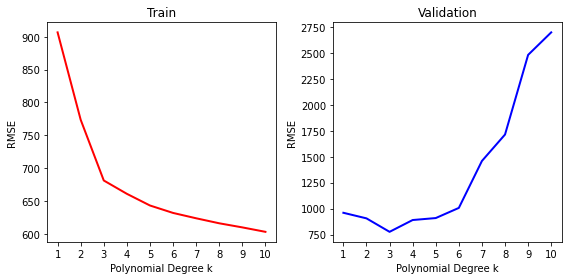

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.plot(poly_result['param_poly_transform__degree'], -poly_result['mean_train_score'], linewidth=2, color='r')
plt.xticks(np.arange(1,11))
plt.xlabel('Polynomial Degree k')
plt.ylabel('RMSE')
plt.title('Train')

plt.subplot(1,2,2)
plt.plot(poly_result['param_poly_transform__degree'], -poly_result['mean_test_score'], linewidth=2, color='b')
plt.title('Validation')
plt.xticks(np.arange(1,11))
plt.xlabel('Polynomial Degree k')
plt.ylabel('RMSE')

plt.tight_layout()
plt.savefig('./figures/q15_bike')
plt.show()

In [ ]:
poly_optimal = Ridge(alpha=10, random_state=42, max_iter=1000).fit(PolynomialFeatures(5).fit_transform(Bike_top5_FS), y_bike)

In [ ]:
np.argsort(poly_optimal.coef_)[::-1]

array([  1,   2, 111, 231,  46,  15,   3,   4,  18, 193,   9,  13, 224,
       156, 225, 189, 190, 198, 155, 126, 232, 112,  47,  16,  10, 242,
        35, 192,  90, 195,  52, 176, 138, 136, 196, 202, 197, 245, 199,
       204,   8,  30,  81, 181, 222, 180, 175,  14, 162, 160, 157, 223,
       167, 191, 215, 114,  49, 234,  94, 249, 158, 211, 164,  45, 169,
       226,  56, 142, 178, 146, 177, 163, 147,  66, 152, 188,  61, 203,
       159,  57,  86, 186, 120, 240, 172,  76, 135,  58, 149, 251, 213,
       179, 194,  74, 247,  67, 153, 110, 144,  38, 250,  36, 154, 210,
        96, 207, 137,  40, 101,  12, 216, 246, 228,  70, 143, 127,  43,
       148, 221, 106, 214,   0, 184,  84,  93, 122, 139,  62, 145,  80,
       236, 116,  51, 104, 219,  71,  64,  98, 241,  69,  79,  33, 187,
        99, 248, 237, 117, 174,  28,  17,  48, 113, 233,  25,  32,  83,
       183, 134, 100, 205, 161,  59,  60,  37,  95, 206, 123, 171,  27,
        75,  92, 200,  77, 173, 132,  91, 243,  31,  82, 182,  7

Suicide Dataset

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge

pipe_poly = Pipeline([
    ('poly_transform', PolynomialFeatures()),
    ('standardize', StandardScaler()),
    ('model', Ridge(alpha=1000, random_state=42, max_iter=10000))
])

param_grid = {
    'poly_transform__degree': np.arange(1,11,1)
}

In [ ]:
grid_poly = GridSearchCV(pipe_poly, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                         scoring='neg_root_mean_squared_error', return_train_score=True).fit(Suicide_top5_FS, y_suicide)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


In [ ]:
poly_result = pd.DataFrame(grid_poly.cv_results_)[['mean_test_score', 'mean_train_score', 'param_poly_transform__degree']]
poly_result

,mean_test_score,mean_train_score,param_poly_transform__degree
0,-15.288837,-15.444549,1
1,-14.177526,-14.305988,2
2,-13.979272,-14.088972,3
3,-13.933213,-14.028516,4
4,-13.898875,-13.984970,5
5,-13.880195,-13.959508,6
6,-13.873712,-13.947910,7
7,-13.872107,-13.942448,8
8,-13.871541,-13.939037,9
9,-13.870757,-13.936194,10


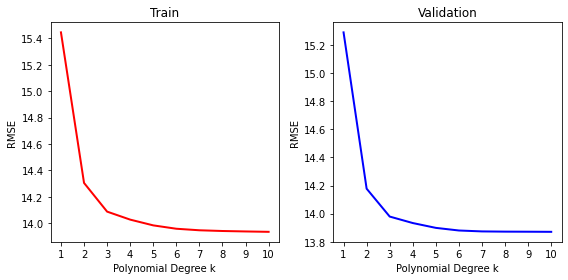

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.plot(poly_result['param_poly_transform__degree'], -poly_result['mean_train_score'], linewidth=2, color='r')
plt.xticks(np.arange(1,11))
plt.xlabel('Polynomial Degree k')
plt.ylabel('RMSE')
plt.title('Train')

plt.subplot(1,2,2)
plt.plot(poly_result['param_poly_transform__degree'], -poly_result['mean_test_score'], linewidth=2, color='b')
plt.title('Validation')
plt.xticks(np.arange(1,11))
plt.xlabel('Polynomial Degree k')
plt.ylabel('RMSE')

plt.tight_layout()
plt.savefig('./figures/q15_suicide')
plt.show()

In [ ]:
poly_optimal = Ridge(alpha=1000, random_state=42, max_iter=1000).fit(PolynomialFeatures(5).fit_transform(Suicide_top5_FS), y_suicide)

In [ ]:
np.argsort(poly_optimal.coef_)[::-1]

array([142,  72, 174,  76, 146,  40,  96, 209,  36,  27,  62, 132, 145,
        75,  12,  26,  61, 131,   2,   7,  22,  57, 127,  11, 208, 167,
       154, 187,  84,  31, 136,  66, 148, 177, 133,  78,  63,  28, 104,
        41, 222, 203,  93,  73, 168, 143, 163,  15, 202,  92, 161,  30,
        65, 135, 128,  58,   8,  23,  82, 184, 152, 183, 200, 218,  94,
       205, 113, 236, 101,  46, 181, 196,  21,   1,   6,  56, 126, 206,
       234, 112,  39, 100, 215, 164, 231, 232, 115, 105,  99,  89,  79,
       118, 119, 122, 123, 124, 250, 139,  85, 149,  88,   0,  53, 155,
        69, 214, 220, 223, 224,  19, 227, 228, 229, 235, 238, 239, 242,
       243, 244, 247, 248, 249, 213, 210, 204, 108, 158, 159, 169, 175,
        54, 178, 179,  50,  34, 185, 188, 189,  44, 192, 193, 194, 109,
       251, 125,   5,  55,  20,   3, 216, 197, 138, 129, 191, 157,  87,
        68,   9,  33,  24,  59, 233, 230,  14, 110,  45, 198, 207,  38,
        98, 212, 199,  47, 114, 237, 111, 116,  48, 240,  83, 18

Video Dataset

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge

pipe_poly = Pipeline([
    ('poly_transform', PolynomialFeatures()),
    ('standardize', StandardScaler()),
    ('model', Ridge(alpha=100, random_state=42, max_iter=10000))
])

param_grid = {
    'poly_transform__degree': np.arange(1,11,1)
}

In [ ]:
grid_poly = GridSearchCV(pipe_poly, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                         scoring='neg_root_mean_squared_error', return_train_score=True).fit(Video_top5_FS, y_video)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


In [ ]:
poly_result = pd.DataFrame(grid_poly.cv_results_)[['mean_test_score', 'mean_train_score', 'param_poly_transform__degree']]
poly_result

,mean_test_score,mean_train_score,param_poly_transform__degree
0,-12.221882,-12.229764,1
1,-9.788216,-9.775168,2
2,-9.312245,-9.296554,3
3,-9.275881,-9.259921,4
4,-9.275122,-9.259120,5
5,-9.273424,-9.257407,6
6,-9.271271,-9.255239,7
7,-9.269442,-9.253396,8
8,-9.267971,-9.251914,9
9,-9.266833,-9.250768,10


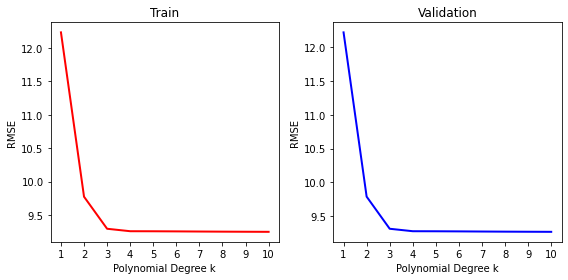

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.plot(poly_result['param_poly_transform__degree'], -poly_result['mean_train_score'], linewidth=2, color='r')
plt.xticks(np.arange(1,11))
plt.xlabel('Polynomial Degree k')
plt.ylabel('RMSE')
plt.title('Train')

plt.subplot(1,2,2)
plt.plot(poly_result['param_poly_transform__degree'], -poly_result['mean_test_score'], linewidth=2, color='b')
plt.title('Validation')
plt.xticks(np.arange(1,11))
plt.xlabel('Polynomial Degree k')
plt.ylabel('RMSE')

plt.tight_layout()
plt.savefig('./figures/q15_video')
plt.show()

In [ ]:
poly_optimal = Ridge(alpha=100, random_state=42, max_iter=1000).fit(PolynomialFeatures(5).fit_transform(Video_top5_FS), y_video)

In [ ]:
np.argsort(poly_optimal.coef_)[::-1]

array([  6,   7,  11,   8,  12,  30,  40, 216,  81, 101, 181,  15,  46,
       111,   3, 231,  24,  68,  98,  78,  28, 212, 177, 157,  38,  91,
        61,  71,  57,  56,  39,  70,  80, 100,  29,  25, 160, 180, 215,
        72, 135, 145, 165,  92, 200,  62,  58, 198, 129, 133, 143, 163,
       144, 164, 130, 134, 199,  76, 250,  85,  84,  83,  82,  79,  77,
        34,  99,  50,  51,  53, 136, 137,  69,  67,  32,  66, 139,  31,
        54, 124, 123, 122,  86,  97,  96,  44,  47, 103, 104, 105, 106,
        42, 108, 109,  41,  48, 112, 113, 114, 115,  89,  88, 116, 117,
        49, 118, 119, 120, 102,   0, 202, 201, 225, 224, 223, 222, 221,
       220, 219, 218, 217, 214, 213, 211, 210, 209, 208, 207, 204, 227,
       228, 229, 241, 249, 248, 247, 245, 244, 243, 242, 240, 232, 239,
       238, 237, 236, 235, 234, 233, 146, 155, 172, 153, 156, 158, 159,
       152, 166, 167, 149, 169,  19,  17, 147, 194, 173, 174, 175, 176,
       187, 193, 192,  16, 190, 189, 178, 188, 186, 185, 184, 18

Question 16

In [ ]:
from sklearn import preprocessing 
from sklearn.feature_selection import f_regression

x_inverse_feature = np.divide(np.prod(X_video[['o_height', 'o_width']], axis=1), X_video['o_bitrate'])
x_inverse_feature = preprocessing.scale(x_inverse_feature)

Video_standard = preprocessing.scale(X_Video)
Fscore = f_regression(Video_standard, y_video)
Video_top5_FS = np.argsort(Fscore[0])[::-1][:5]
Video_standard_top5_FS = Video_standard[:, Video_top5_FS]

xs_inverse_concat = np.concatenate((Video_standard_top5_FS, x_inverse_feature.reshape(-1,1)), axis=1)

lm_inverse_concat = cross_validate(Ridge(alpha=100, random_state=42, max_iter=1000), 
                                   xs_inverse_concat, y_video, scoring='neg_root_mean_squared_error', cv=10)
rmse_inverse_concat = np.mean(-lm_inverse_concat['test_score'])

-11.709974856431229

## Neural Network

Bike Dataset

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor

# tune the number of neurons for the first hidden layer
pipe_hidden_layer1 = Pipeline([
    ('standardize', StandardScaler()),
    ('model', MLPRegressor(random_state=42, max_iter=2000))
])

param_grid = {
    'model__hidden_layer_sizes': [(x,) for x in np.arange(1, 51)]
}


grid_hidden_layer1 = GridSearchCV(pipe_hidden_layer1, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                                  scoring='neg_root_mean_squared_error', return_train_score=True).fit(X_bike, y_bike)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


In [ ]:
nn1_results = pd.DataFrame(grid_hidden_layer1.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__hidden_layer_sizes']]
nn1_results = nn1_results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
nn1_results.head()

,mean_test_score,mean_train_score,param_model__hidden_layer_sizes
0,-1557.936849,-1389.603522,"(45,)"
1,-1563.829443,-1418.421957,"(41,)"
2,-1577.571183,-1424.314107,"(42,)"
3,-1584.532552,-1436.021290,"(40,)"
4,-1584.944784,-1425.803009,"(50,)"


In [ ]:
# tune the number of neurons for the second hidden layer
pipe_hidden_layer2 = Pipeline([
    ('standardize', StandardScaler()),
    ('model', MLPRegressor(random_state=42, max_iter=2000))
])

param_grid = {
    'model__hidden_layer_sizes': [(45,x) for x in np.arange(1, 51)]
}


grid_hidden_layer2 = GridSearchCV(pipe_hidden_layer2, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                                  scoring='neg_root_mean_squared_error', return_train_score=True).fit(X_bike, y_bike)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


In [ ]:
import pandas as pd
nn2_results = pd.DataFrame(grid_hidden_layer2.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__hidden_layer_sizes']]
nn2_results = nn2_results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
nn2_results.head()

,mean_test_score,mean_train_score,param_model__hidden_layer_sizes
0,-788.845535,-536.397671,"(45, 48)"
1,-789.919471,-540.874244,"(45, 43)"
2,-796.624352,-553.364363,"(45, 38)"
3,-797.438264,-541.731270,"(45, 45)"
4,-800.221603,-539.402430,"(45, 47)"


In [ ]:
# tune the regularization term
pipe_reg = Pipeline([
    ('standardize', StandardScaler()),
    ('model', MLPRegressor(hidden_layer_sizes=(45,48), random_state=42, max_iter=2000))
])

param_grid = {
    'model__alpha': [10.0**x for x in np.arange(-3,4)]
}


grid_reg = GridSearchCV(pipe_reg, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                        scoring='neg_root_mean_squared_error', return_train_score=True).fit(X_bike, y_bike)

Fitting 10 folds for each of 7 candidates, totalling 70 fits


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


In [ ]:
nnreg_results = pd.DataFrame(grid_reg.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__alpha']]
nnreg_results = nnreg_results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
nnreg_results

,mean_test_score,mean_train_score,param_model__alpha
0,-767.629123,-496.654270,1000
1,-781.831469,-508.209287,100
2,-786.528171,-520.776532,10
3,-788.797611,-534.398523,0.1
4,-789.869079,-535.165551,0.01
5,-790.216963,-532.572578,1
6,-790.583357,-536.317273,0.001


Suicide Dataset

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor

# tune the number of neurons for the first hidden layer
pipe_hidden_layer1 = Pipeline([
    ('standardize', StandardScaler()),
    ('model', MLPRegressor(random_state=42, max_iter=2000))
])

param_grid = {
    'model__hidden_layer_sizes': [(x,) for x in np.arange(1, 51)]
}


grid_hidden_layer1 = GridSearchCV(pipe_hidden_layer1, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                                  scoring='neg_root_mean_squared_error', return_train_score=True).fit(X_suicide, y_suicide)

In [ ]:
nn1_results = pd.DataFrame(grid_hidden_layer1.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__hidden_layer_sizes']]
nn1_results = nn1_results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
nn1_results.head()

In [ ]:
# tune the number of neurons for the second hidden layer
pipe_hidden_layer2 = Pipeline([
    ('standardize', StandardScaler()),
    ('model', MLPRegressor(random_state=42, max_iter=2000))
])

param_grid = {
    'model__hidden_layer_sizes': [(14,x) for x in np.arange(1, 51)]
}


grid_hidden_layer2 = GridSearchCV(pipe_hidden_layer2, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                                  scoring='neg_root_mean_squared_error', return_train_score=True).fit(X_suicide, y_suicide)

In [ ]:
nn2_results = pd.DataFrame(grid_hidden_layer2.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__hidden_layer_sizes']]
nn2_results = nn2_results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
nn2_results.head()

In [ ]:
# tune the regularization term
pipe_reg = Pipeline([
    ('standardize', StandardScaler()),
    ('model', MLPRegressor(hidden_layer_sizes=(14,42), random_state=42, max_iter=2000))
])

param_grid = {
    'model__alpha': [10.0**x for x in np.arange(-3,4)]
}


grid_reg = GridSearchCV(pipe_reg, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                        scoring='neg_root_mean_squared_error', return_train_score=True).fit(X_suicide, y_suicide)

Fitting 10 folds for each of 7 candidates, totalling 70 fits


In [ ]:
nnreg_results = pd.DataFrame(grid_reg.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__alpha']]
nnreg_results = nnreg_results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
nnreg_results

Video Dataset

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor

# tune the number of neurons for the first hidden layer
pipe_hidden_layer1 = Pipeline([
    ('standardize', StandardScaler()),
    ('model', MLPRegressor(random_state=42, max_iter=2000))
])

param_grid = {
    'model__hidden_layer_sizes': [(x,) for x in np.arange(1, 51)]
}


grid_hidden_layer1 = GridSearchCV(pipe_hidden_layer1, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                                  scoring='neg_root_mean_squared_error', return_train_score=True).fit(X_video, y_video)

In [ ]:
nn1_results = pd.DataFrame(grid_hidden_layer1.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__hidden_layer_sizes']]
nn1_results = nn1_results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
nn1_results.head()

In [ ]:
# tune the number of neurons for the second hidden layer
pipe_hidden_layer2 = Pipeline([
    ('standardize', StandardScaler()),
    ('model', MLPRegressor(random_state=42, max_iter=2000))
])

param_grid = {
    'model__hidden_layer_sizes': [(16,x) for x in np.arange(1, 51)]
}


grid_hidden_layer2 = GridSearchCV(pipe_hidden_layer2, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                                  scoring='neg_root_mean_squared_error', return_train_score=True).fit(X_video, y_video)

In [ ]:
nn2_results = pd.DataFrame(grid_hidden_layer2.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__hidden_layer_sizes']]
nn2_results = nn2_results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
nn2_results.head()

In [ ]:
# tune the regularization term
pipe_reg = Pipeline([
    ('standardize', StandardScaler()),
    ('model', MLPRegressor(hidden_layer_sizes=(16,40), random_state=42, max_iter=2000))
])

param_grid = {
    'model__alpha': [10.0**x for x in np.arange(-3,4)]
}


grid_reg = GridSearchCV(pipe_reg, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, 
                        scoring='neg_root_mean_squared_error', return_train_score=True).fit(X_video, y_video)

Fitting 10 folds for each of 7 candidates, totalling 70 fits


In [ ]:
nnreg_results = pd.DataFrame(grid_reg.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__alpha']]
nnreg_results = nnreg_results.sort_values(by=['mean_test_score'], ascending=False).reset_index(drop=True)
nnreg_results

,mean_test_score,mean_train_score,param_model__alpha
0,-4.576987,-2.989207,10
1,-5.199665,-2.101557,0.1
2,-5.451134,-5.117978,100
3,-5.465738,-2.196023,1
4,-5.566484,-2.064144,0.01
5,-7.588690,-1.992723,0.001
6,-9.292474,-9.234952,1000


## Random Forest

Bike Dataset

In [ ]:
from sklearn.model_selection import train_test_split
X_train,y_train,X_test,y_test = train_test_split( X_bike_best, y_bike, test_size = 0.2,  random_state = 42)


In [ ]:
#tune features and num_of_tree first
#80 min to run
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

tree_num = np.arange(1, 201) #best tree:50
max_feature_num = np.arange(1,9) #best feature num:4

rmse = [[], [], [], [], [],[],[],[]]
oob_error = [[], [], [], [], [],[],[],[]]


for i in tree_num:
    for j in max_feature_num:
        rfr = RandomForestRegressor(n_estimators = i, max_features = j, max_depth = 20, bootstrap = True, oob_score = True, random_state = 42)
        rfr.fit(X_train, X_test)
        rfr_pred = cross_val_predict(rfr, X_train, X_test, cv = 10)
        rmse[j-1].append(np.sqrt(mean_squared_error(X_test, rfr_pred)))
        oob_error[j-1].append(1-rfr.oob_score_)
print (rmse)
print (oob_error)

f = plt.figure() 
f.set_figwidth(8) 
f.set_figheight(6)
for i in range(8):
  plt.plot(rmse[i], label = 'max_feature_num = % i' %max_feature_num[i])
plt.title('average Test-RMSE against # trees')
plt.xlabel('number of trees')
plt.ylabel('average Test-RMSE')
plt.ylim([700,1000])
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-bike-01rmse.png') #savefig goes before plt.show()!!!!!!
plt.show()

f = plt.figure() 
f.set_figwidth(8) 
f.set_figheight(6)
for i in range(8):
  plt.plot(oob_error[i], label = 'max_feature_num = % i' % max_feature_num[i])
plt.title('oob_error against # trees')
plt.xlabel('number of trees')
plt.ylabel('oob_error')
plt.ylim([0,1])
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-bike-01oob.png')
plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


In [ ]:
#random max_depth=20, fixed num of trees to 50, compare max_features of 3 and 4: 
#max_feature=3 -> score: 0.8828
#max_feature=4 -> score: 0.8886
#(if max_depth lower than 10, then max_feature of 3 performs better, but scores are lower, around 0.82;)
#tested around: when max_depth over 10, when the score started to fluctuate around 0.88, max_feature of 4 performs better

#then using these numbers to test depth, got max_depth=15
#score:0.89275
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=50,max_depth=15,max_features=4,random_state=42)
rf.fit(X_train, X_test)
score=rf.score(y_train,y_test)
print("Random Forest Score on Bike Dataset: ", score)
#y_pred = rf.predict(y_train)

In [ ]:
#then tune max_depth
max_depth_num=np.arange(1,51)

rmse = np.zeros(50)
oob_error = np.zeros(50)

for i in max_depth_num:
    rf_d = RandomForestRegressor(n_estimators = 50, max_features = 4, max_depth = i, bootstrap = True, oob_score = True, random_state = 42)
    rf_d.fit(X_train, X_test)
    rfd_pred = cross_val_predict(rf_d, X_train, X_test, cv = 10)
    rmse[i-1]=np.sqrt(mean_squared_error(X_test, rfd_pred))
    oob_error[i-1]=1-rf_d.oob_score_
print ("rmse for max_depth",rmse)
print ("oob for max_depth",oob_error)

plt.figure(figsize=(8, 6)) 
plt.plot(max_depth_num,rmse)
plt.title('average Test-RMSE against max depth')
plt.xlabel('depth')
plt.ylabel('average Test-RMSE')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-bike-02rmse.png')
plt.show()

f = plt.figure() 
f.set_figwidth(8) 
f.set_figheight(6)
plt.plot(max_depth_num,oob_error)
plt.title('oob_error against max depth')
plt.xlabel('depth')
plt.ylabel('oob_error')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-bike-02oob.png')
plt.show()

In [ ]:
#BIKE DATASET
selector = SelectKBest(f_regression,k=8).fit(X_bike, y_bike)
mask = selector.get_support() #list of booleans
bike_features_best = [] # The list of your K best features

for bool, feature in zip(mask, bike_features):
    if bool:
        bike_features_best.append(feature)
print(bike_features_best)

['temp', 'atemp', 'hum', 'windspeed', 'yr', 'mnth', 'weathersit', 'season']


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import export_graphviz
import pydot

rf_small = RandomForestRegressor(n_estimators=50, max_features=4, max_depth = 4, criterion="mae")
rf_small.fit(X_train, X_test)
tree_small = rf_small.estimators_[5]
export_graphviz(tree_small, out_file = 'small_tree_bike.dot', feature_names = bike_features_best, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree_bike.dot')
graph.write_png(f'./figures/small_tree_bike.png')

In [ ]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(bike_features_best, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

Variable: temp                 Importance: 0.27
Variable: yr                   Importance: 0.26
Variable: atemp                Importance: 0.18
Variable: season               Importance: 0.1
Variable: hum                  Importance: 0.07
Variable: mnth                 Importance: 0.05
Variable: windspeed            Importance: 0.04
Variable: weathersit           Importance: 0.02


[None, None, None, None, None, None, None, None]

Suicide Dataset

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder 

categorical_features = ['year','age','generation','sex','country']
numerical_features = ['population',' gdp_for_year ($) ','gdp_per_capita ($)']
suicide_features = numerical_features + categorical_features

suicide_preprocessing_pipeline = ColumnTransformer([
    ('numerical', StandardScaler(), numerical_features),
    ('ordinal', OrdinalEncoder(), categorical_features)
])

X_suicide = suicide_preprocessing_pipeline.fit_transform(suicide_df[suicide_features])
y_suicide = suicide_df["suicides/100k pop"].values # suicide rate (suicides/100k pop)

print('Suicide rates dataset')
print(f'X shape: {X_suicide.shape}')
print(f'y shape: {y_suicide.shape}')

Suicide rates dataset
X shape: (27820, 8)
y shape: (27820,)


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


[[14.159475505368391, 13.237221117705891, 12.536576638669725, 11.977496904576796, 12.210134827715192, 12.318115871137861, 12.27010873967952, 12.08243521798837, 11.924831275215109, 11.827299182022486, 11.928411205566151, 11.890797905550055, 11.971019359135823, 11.930938807480047, 11.926963617585617, 11.940382229033943, 11.88620724407981, 11.884740870864638, 11.86563600480379, 11.828172723959378, 11.823410356087207, 11.861451429608524, 11.857760036234573, 11.822666860733374, 11.849480717937661, 11.876644066871757, 11.899908677677656, 11.861031866566785, 11.863575188369191, 11.879957802411392, 11.836999871993056, 11.848001698535167, 11.859962274651412, 11.903274059320667, 11.948859508247574, 11.945028967969485, 11.927606526768402, 11.899818673219858, 11.906211370878399, 11.893129674201, 11.875657624145495, 11.83712060934567, 11.80750319806294, 11.79971449014793, 11.81503346555482, 11.79736317975592, 11.839973538013558, 11.828826400432172, 11.816941223777897, 11.798327217676258, 11.7966844

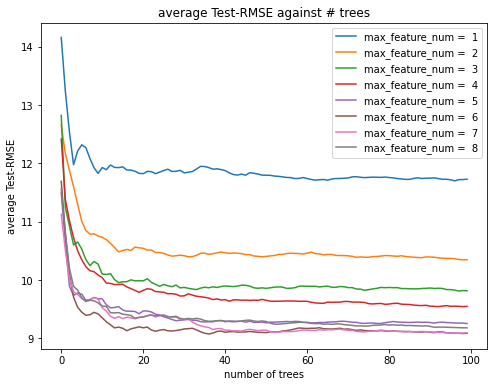

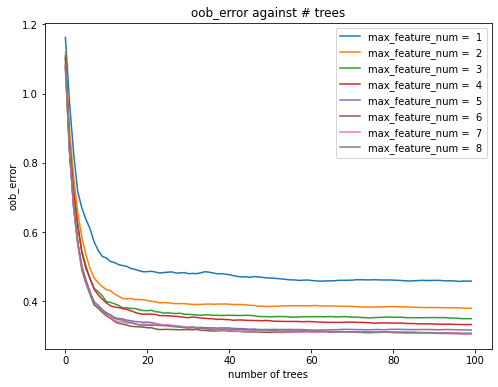

In [ ]:

from sklearn.model_selection import train_test_split
X_train,y_train,X_test,y_test = train_test_split( X_suicide, y_suicide, test_size = 0.2,  random_state = 42)

from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

tree_num = np.arange(1, 101) #best tree:60
max_feature_num = np.arange(1,9) #best feature num:6

rmse = [[], [], [], [], [],[],[],[]]
oob_error = [[], [], [], [], [],[],[],[]]


for i in tree_num:
    for j in max_feature_num:
        rfr = RandomForestRegressor(n_estimators = i, max_features = j, max_depth = 10, bootstrap = True, oob_score = True, random_state = 42)
        rfr.fit(X_train, X_test)
        rfr_pred = rfr.predict(X_train)
        rmse[j-1].append(np.sqrt(mean_squared_error(X_test, rfr_pred)))
        oob_error[j-1].append(1-rfr.oob_score_)
print (rmse)
print (oob_error)

f = plt.figure() 
f.set_figwidth(8) 
f.set_figheight(6)
for i in range(8):
  plt.plot(rmse[i], label = 'max_feature_num = % i' %max_feature_num[i])
plt.title('average Test-RMSE against # trees')
plt.xlabel('number of trees')
plt.ylabel('average Test-RMSE')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-s-01rmse.png') #savefig goes before plt.show()!!!!!!
plt.show()

f = plt.figure() 
f.set_figwidth(8) 
f.set_figheight(6)
for i in range(8):
  plt.plot(oob_error[i], label = 'max_feature_num = % i' % max_feature_num[i])
plt.title('oob_error against # trees')
plt.xlabel('number of trees')
plt.ylabel('oob_error')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-s-01oob.png')
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=48,max_depth=22,max_features=8,random_state=42) #48/22/8!
rf.fit(X_train, X_test)
score=rf.score(y_train,y_test)
print("Random Forest Score on Suicide Dataset: ", score)

Random Forest Score on Suicide Dataset:  0.872692012932728


No handles with labels found to put in legend.


rmse for max_depth [17.33371166 16.28168987 15.28528714 14.69009282 14.25061629 13.54999325
 12.7161894  11.65499508 10.46085539  9.11627304  7.89568469  6.82532947
  5.93843683  4.93989554  4.2412251   3.64586854  3.30069668  3.02003931
  2.86724263  2.72677402  2.69768658  2.61381689  2.63608987  2.58220322
  2.58266927  2.60461902  2.58245438  2.57065529  2.60955932  2.59845788
  2.60191717  2.59266062  2.58503829  2.58842076  2.57435241  2.57735415
  2.57034242  2.57096567  2.5682337   2.57353493]
oob for max_depth [0.83130699 0.7354119  0.64956868 0.60152401 0.57211631 0.53058368
 0.48620911 0.43058842 0.37245659 0.31198464 0.26517233 0.22666505
 0.20817213 0.17625181 0.16303171 0.15161645 0.14662296 0.14205481
 0.14227472 0.13680507 0.13718967 0.13381773 0.13838382 0.13459003
 0.13502145 0.13662732 0.13658177 0.13401801 0.13919277 0.13717277
 0.13853663 0.13732794 0.13616965 0.13588142 0.13459339 0.13508261
 0.13408928 0.13471395 0.13443802 0.13474578]


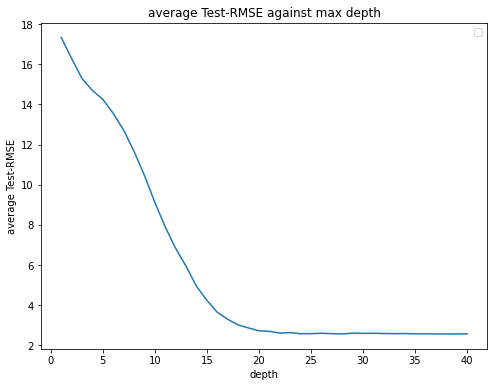

No handles with labels found to put in legend.


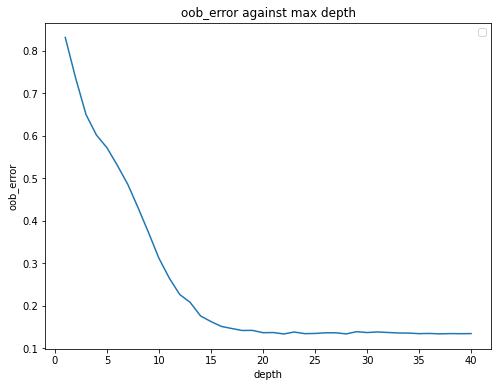

In [ ]:
#ALTERNATE WAY OF DETERMINING! WITHOUT CROSS VALIDATION, MUCH FASTER
from sklearn.model_selection import cross_val_predict

max_depth_num=np.arange(1,41)

rmse = np.zeros(40)
oob_error = np.zeros(40)

for i in max_depth_num:
    rf_d = RandomForestRegressor(n_estimators = 47, max_features = 6, max_depth = i, bootstrap = True, oob_score = True, random_state = 42)
    rf_d.fit(X_train, X_test)
    rfd_pred = rf_d.predict(X_train)
   # rfd_pred = cross_val_predict(rf_d, X_train, X_test, cv = 5)
    rmse[i-1]=np.sqrt(mean_squared_error(X_test, rfd_pred))
    oob_error[i-1]=1-rf_d.oob_score_
print ("rmse for max_depth",rmse)
print ("oob for max_depth",oob_error)

plt.figure(figsize=(8, 6)) 
plt.plot(max_depth_num,rmse)
plt.title('average Test-RMSE against max depth')
plt.xlabel('depth')
plt.ylabel('average Test-RMSE')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-ss-02rmse.png')
plt.show()

f = plt.figure() 
f.set_figwidth(8) 
f.set_figheight(6)
plt.plot(max_depth_num,oob_error)
plt.title('oob_error against max depth')
plt.xlabel('depth')
plt.ylabel('oob_error')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-s-02oob.png')
plt.show()

In [ ]:
#FURTHER OPTIMIZATION!
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

tree_num = np.arange(40, 51) 
max_feature_num = np.arange(5,9)
max_depth_num=np.arange(20,25)
max_score=0
a=0
b=0
c=0
for i in tree_num:
  for j in max_feature_num:
    for k in max_depth_num:
      rf=RandomForestRegressor(n_estimators=i,max_depth=k,max_features=j,random_state=42)
      rf.fit(X_train, X_test)
      score=rf.score(y_train,y_test)
      print("num of tree: %i"%i, "max_feature:%i" %j, "max depth: %i"%k ,"score: ", score)
      if score>max_score:
        max_score=score
        a=i
        b=j
        c=k
print(a,b,c,max_score)

num of tree: 40 max_feature:5 max depth: 20 score:  0.8675627931242709
num of tree: 40 max_feature:5 max depth: 21 score:  0.8663955367448759
num of tree: 40 max_feature:5 max depth: 22 score:  0.8656981297450876
num of tree: 40 max_feature:5 max depth: 23 score:  0.8664094624371828
num of tree: 40 max_feature:5 max depth: 24 score:  0.8634751258583513
num of tree: 40 max_feature:6 max depth: 20 score:  0.8698579796063701
num of tree: 40 max_feature:6 max depth: 21 score:  0.8670460648473731
num of tree: 40 max_feature:6 max depth: 22 score:  0.870342284400103
num of tree: 40 max_feature:6 max depth: 23 score:  0.8644684578859696
num of tree: 40 max_feature:6 max depth: 24 score:  0.8715025957042015
num of tree: 40 max_feature:7 max depth: 20 score:  0.8668830125379178
num of tree: 40 max_feature:7 max depth: 21 score:  0.8693121470307007
num of tree: 40 max_feature:7 max depth: 22 score:  0.867368506852664
num of tree: 40 max_feature:7 max depth: 23 score:  0.8665516281060929
num of t

In [ ]:

#get best feature names
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import export_graphviz
import pydot
#from sklearn.model_selection import train_test_split

#X_train,y_train,X_test,y_test = train_test_split(X_suicide, y_suicide, test_size = 0.2,  random_state = 42)

rf=RandomForestRegressor(n_estimators=48,max_depth=22,max_features=8,random_state=42)
rf.fit(X_train, X_test)

#===================
rf_small = RandomForestRegressor(n_estimators=48, max_features=8, max_depth = 4)
rf_small.fit(X_train, X_test)
tree_small = rf_small.estimators_[5]
export_graphviz(tree_small, out_file = 'small_tree_s.dot', feature_names = suicide_features,rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree_s.dot')
graph.write_png(f'./figures/small_tree_s.png')

# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(suicide_features, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

Variable: country              Importance: 0.21
Variable: age                  Importance: 0.2
Variable: population           Importance: 0.17
Variable: sex                  Importance: 0.15
Variable:  gdp_for_year ($)    Importance: 0.12
Variable: gdp_per_capita ($)   Importance: 0.09
Variable: year                 Importance: 0.05
Variable: generation           Importance: 0.01


[None, None, None, None, None, None, None, None]

Video Dataset

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


[[11.729765382142984, 10.594141641892506, 8.761291827000854, 8.14208878132576, 7.20294380188022, 6.935282684575587, 6.981300044611004, 7.036691014093128, 6.67213296834852, 6.80730011208873, 6.788464793823196, 6.800056119278124, 6.815357163764573, 6.860364763514742, 6.761738065986536, 6.671090523134014, 6.539077839831183, 6.5618413134983165, 6.432210693695624, 6.427298532104477, 6.444733840372242, 6.407761001008351, 6.365734016011232, 6.271241909913108, 6.156887343815361, 6.251847198099841, 6.251521642697264, 6.231340823984897, 6.2014899823282486, 6.267134799005032, 6.2892994299833695, 6.232650174400713, 6.169312929018749, 6.175218616049894, 6.158531123082741, 6.130583479044981, 6.137058826452073, 6.141166485739946, 6.172607989145025, 6.2070338693498694, 6.223397054979941, 6.222575795255724, 6.230219498229356, 6.2362857651577555, 6.288534604105384, 6.2882934210792065, 6.241905726236951, 6.249249121631943, 6.248467031773987, 6.269650270754433, 6.304271627307276, 6.356041708972768, 6.3551

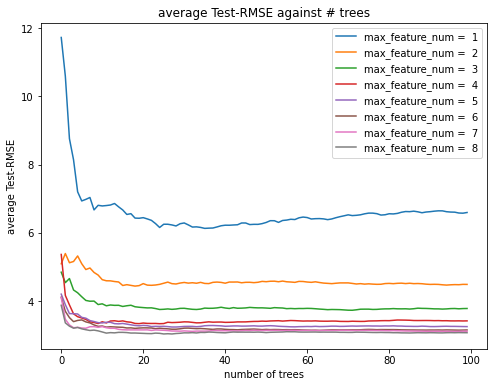

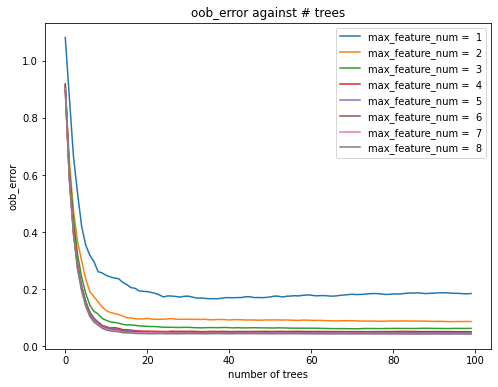

In [ ]:
X_train,y_train,X_test,y_test = train_test_split( X_video_best, y_video, test_size = 0.2,  random_state = 42)

tree_num = np.arange(1, 101) #best tree:50
max_feature_num = np.arange(1,9) #best feature num:4

rmse = [[], [], [], [], [],[],[],[]]
oob_error = [[], [], [], [], [],[],[],[]]

for i in tree_num:
    for j in max_feature_num:
        rfr = RandomForestRegressor(n_estimators = i, max_features = j, max_depth = 10, bootstrap = True, oob_score = True, random_state = 42)
        rfr.fit(X_train, X_test)
        rfr_pred = rfr.predict(X_train) #cross_val_predict(rfr, X_train, X_test, cv = 10)
        rmse[j-1].append(np.sqrt(mean_squared_error(X_test, rfr_pred)))
        oob_error[j-1].append(1-rfr.oob_score_)
print (rmse)
print (oob_error)

plt.figure(figsize=(8,6))
for i in range(8):
  plt.plot(rmse[i], label = 'max_feature_num = % i' %max_feature_num[i])
plt.title('average Test-RMSE against # trees')
plt.xlabel('number of trees')
plt.ylabel('average Test-RMSE')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-video-01rmse.png')
plt.show()

plt.figure(figsize=(8,6))
for i in range(8):
  plt.plot(oob_error[i], label = 'max_feature_num = % i' % max_feature_num[i])
plt.title('oob_error against # trees')
plt.xlabel('number of trees')
plt.ylabel('oob_error')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-video-01oob.png')
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=20,max_depth=20,max_features=8,random_state=42) #47/8/4
rf.fit(X_train, X_test)
score=rf.score(y_train,y_test)
print("Random Forest Score on Video Dataset: ", score)

Random Forest Score on Video Dataset:  0.9871569449887299


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


rmse for max_depth [14.06860466 11.18939989  9.14142921  7.45919421  6.11630158  5.30780901
  4.60362838  4.00245968  3.50873743  3.05579408  2.68687693  2.26766387
  1.79063356  1.48126696  1.24480548  1.02979346  0.88540298  0.83731981
  0.78843663  0.80242478  0.78046262  0.778691    0.75756311  0.77919764
  0.77325326  0.77815775  0.80778029  0.79513481  0.78750848  0.82282536
  0.81188303  0.80913723  0.80913723  0.80913723  0.80913723  0.80913723
  0.80913723  0.80913723  0.80913723  0.80913723  0.80913723  0.80913723
  0.80913723  0.80913723  0.80913723  0.80913723  0.80913723  0.80913723
  0.80913723  0.80913723]
oob for max_depth [0.76238454 0.48824624 0.32786927 0.2209779  0.15077678 0.11337757
 0.08710606 0.06864551 0.05468685 0.04481131 0.03878286 0.03154421
 0.02554296 0.02192783 0.01965916 0.01898837 0.01636061 0.01701422
 0.01596662 0.01675886 0.01621    0.01634632 0.01562021 0.01650829
 0.0161676  0.01627953 0.01752315 0.01730441 0.01661077 0.0180859
 0.01734177 0.01738

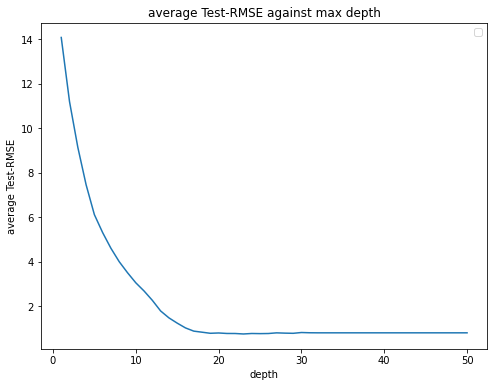

No handles with labels found to put in legend.


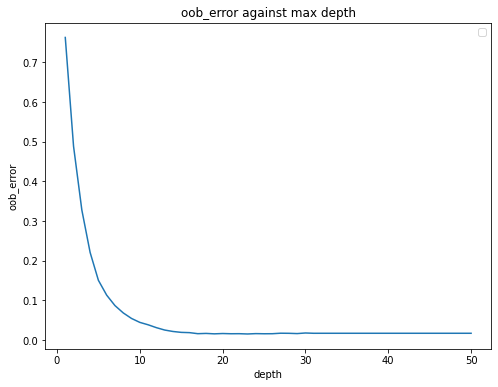

In [ ]:
#then tune max_depth
max_depth_num=np.arange(1,51)

rmse = np.zeros(50)
oob_error = np.zeros(50)

for i in max_depth_num:
    rf_d = RandomForestRegressor(n_estimators = 20, max_features = 8, max_depth = i, bootstrap = True, oob_score = True, random_state = 42)
    rf_d.fit(X_train, X_test)
    rfd_pred = rf_d.predict(X_train)
    rmse[i-1]=np.sqrt(mean_squared_error(X_test, rfd_pred))
    oob_error[i-1]=1-rf_d.oob_score_
print ("rmse for max_depth",rmse)
print ("oob for max_depth",oob_error)

plt.figure(figsize=(8, 6)) 
plt.plot(max_depth_num,rmse)
plt.title('average Test-RMSE against max depth')
plt.xlabel('depth')
plt.ylabel('average Test-RMSE')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-video-02rmse.png')
plt.show()

f = plt.figure() 
f.set_figwidth(8) 
f.set_figheight(6)
plt.plot(max_depth_num,oob_error)
plt.title('oob_error against max depth')
plt.xlabel('depth')
plt.ylabel('oob_error')
plt.legend(loc = 'best')
plt.savefig(f'./figures/rf-video-02oob.png')
plt.show()

In [ ]:
#get feature name of X_suicide
ordinal_features = ['width','height','o_width','o_height']
one_hot_features = ['codec','o_codec']
numerical_features = ['duration','bitrate','frames','framerate',
                      'i','p','b','i_size','p_size','size',
                      'o_bitrate','o_framerate']

encoder=OneHotEncoder(drop='if_binary')
encoder.fit_transform(video_df[one_hot_features])
temp_arr=encoder.get_feature_names()

video_f=numerical_features+ordinal_features

for i in range(temp_arr.size):
  video_f.append(temp_arr[i])

#get best feature names
from sklearn.feature_selection import SelectKBest,f_regression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import export_graphviz
import pydot
from sklearn.model_selection import train_test_split

X_train,y_train,X_test,y_test = train_test_split(X_video_best, y_video, test_size = 0.2,  random_state = 42)

from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=20,max_depth=20,max_features=8,random_state=42)
rf.fit(X_train, X_test)

selector = SelectKBest(f_regression,k=12).fit(X_video, y_video)
mask = selector.get_support() #list of booleans
video_features_best = [] # The list of your K best features

for bool, feature in zip(mask, video_f):
    if bool:
        video_features_best.append(feature)
print(video_features_best)
print(video_f)
#===================
rf_small = RandomForestRegressor(n_estimators=20, max_features=8, max_depth = 4)
rf_small.fit(X_train, X_test)
tree_small = rf_small.estimators_[5]
export_graphviz(tree_small, out_file = 'small_tree_suicide.dot', feature_names = video_features_best,rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree_suicide.dot')
graph.write_png(f'./figures/small_tree_video.png')

# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(video_features_best, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

['bitrate', 'p_size', 'size', 'o_bitrate', 'o_framerate', 'width', 'height', 'o_width', 'o_height', 'x1_flv', 'x1_h264', 'x1_mpeg4']
['duration', 'bitrate', 'frames', 'framerate', 'i', 'p', 'b', 'i_size', 'p_size', 'size', 'o_bitrate', 'o_framerate', 'width', 'height', 'o_width', 'o_height', 'x0_flv', 'x0_h264', 'x0_mpeg4', 'x0_vp8', 'x1_flv', 'x1_h264', 'x1_mpeg4', 'x1_vp8']
Variable: x1_h264              Importance: 0.25
Variable: o_width              Importance: 0.18
Variable: o_bitrate            Importance: 0.15
Variable: o_height             Importance: 0.15
Variable: x1_flv               Importance: 0.06
Variable: bitrate              Importance: 0.05
Variable: x1_mpeg4             Importance: 0.05
Variable: p_size               Importance: 0.04
Variable: o_framerate          Importance: 0.04
Variable: size                 Importance: 0.02
Variable: width                Importance: 0.01
Variable: height               Importance: 0.01


[None, None, None, None, None, None, None, None, None, None, None, None]

In [ ]:
# Video transcoding time dataset
video_df = pd.read_csv('./online_video_dataset/transcoding_mesurment.tsv',sep='\t')

category_features = ['width','height','o_width','o_height','codec','o_codec']
numerical_features = ['duration','bitrate','frames','framerate',
                      'i','p','b','i_size','p_size','size',
                      'o_bitrate','o_framerate']
video_features = numerical_features + category_features 
# Standardize numerical features and encode categorical features with integers
# Note that we do not manually perform one hot encoding (like for linear/polynomial regression)! 
video_preprocessing_pipeline = ColumnTransformer([
    ('numerical', StandardScaler(), numerical_features),
    ('category', OrdinalEncoder(), category_features),
])
X_video = video_preprocessing_pipeline.fit_transform(video_df[video_features])
y_video = video_df["utime"].values # total count 
X_train,y_train,X_test,y_test = train_test_split(X_video, y_video, test_size = 0.2,  random_state = 42)



train_rmse = np.zeros(50)
test_rmse = np.zeros(50)

max_depth_num=np.arange(1,51)

for i in max_depth_num:
    rf_d = RandomForestRegressor(n_estimators = 20, max_features = 8, max_depth = i, bootstrap = True, oob_score = True, random_state = 42)
    rf_d.fit(X_train, X_test)
    pred1 = rf_d.predict(X_train)
    train_rmse[i-1]=np.sqrt(mean_squared_error(X_test, pred1))
    pred2 = rf_d.predict(y_train)
    test_rmse[i-1]=np.sqrt(mean_squared_error(y_test, pred2))

plt.figure(figsize=(8, 6)) 
plt.plot(max_depth_num,train_rmse,label="training rmse")
plt.plot(max_depth_num,test_rmse,label="testing rmse")
plt.xlabel('num_leaves')
plt.ylabel('RMSE')
plt.legend(loc = 'best')
#plt.savefig(f'./figures/lgbm-01.png')
plt.show()

train_rmse = np.zeros(50)
test_rmse = np.zeros(50)
num_tree_num=np.arange(1,51)

for i in num_tree_num:
    rf_d = RandomForestRegressor(n_estimators = i, max_features = 8, max_depth = 20, bootstrap = True, oob_score = True, random_state = 42)
    rf_d.fit(X_train, X_test)
    pred1 = rf_d.predict(X_train)
    train_rmse[i-1]=np.sqrt(mean_squared_error(X_test, pred1))
    pred2 = rf_d.predict(y_train)
    test_rmse[i-1]=np.sqrt(mean_squared_error(y_test, pred2))

plt.figure(figsize=(8, 6)) 
plt.plot(num_tree_num,train_rmse,label="training rmse")
plt.plot(num_tree_num,test_rmse,label="testing rmse")
plt.xlabel('num_leaves')
plt.ylabel('RMSE')
plt.legend(loc = 'best')
#plt.savefig(f'./figures/lgbm-01.png')
plt.show()

train_rmse = np.zeros(14)
test_rmse = np.zeros(14)
max_feature_num=np.arange(1,15)

for i in max_feature_num:
    rf_d = RandomForestRegressor(n_estimators = 20, max_features = i, max_depth = 20, bootstrap = True, oob_score = True, random_state = 42)
    rf_d.fit(X_train, X_test)
    pred1 = rf_d.predict(X_train)
    train_rmse[i-1]=np.sqrt(mean_squared_error(X_test, pred1))
    pred2 = rf_d.predict(y_train)
    test_rmse[i-1]=np.sqrt(mean_squared_error(y_test, pred2))

plt.figure(figsize=(8, 6)) 
plt.plot(max_feature_num,train_rmse,label="training rmse")
plt.plot(max_feature_num,test_rmse,label="testing rmse")
plt.xlabel('num_leaves')
plt.ylabel('RMSE')
plt.legend(loc = 'best')
#plt.savefig(f'./figures/lgbm-01.png')
plt.show()

## LightGBM, CatBoost and Bayesian Optimization

In [ ]:
import lightgbm as lgb
from catboost import Pool, CatBoostRegressor
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer


# Video transcoding time dataset
video_df = pd.read_csv('./online_video_dataset/transcoding_mesurment.tsv',sep='\t')

category_features = ['width','height','o_width','o_height','codec','o_codec']
numerical_features = ['duration','bitrate','frames','framerate',
                      'i','p','b','i_size','p_size','size',
                      'o_bitrate','o_framerate']
video_features = numerical_features + category_features 
# Standardize numerical features and encode categorical features with integers
# Note that we do not manually perform one hot encoding (like for linear/polynomial regression)! 
video_preprocessing_pipeline = ColumnTransformer([
    ('numerical', StandardScaler(), numerical_features),
    ('category', OrdinalEncoder(), category_features),
])
X_video = video_preprocessing_pipeline.fit_transform(video_df[video_features])
y_video = video_df["utime"].values # total count 

print('-------------------------')
print('LightGBM')

lgbm_param_grid = {
    'learning_rate': Real(0.001, 1.0, 'log-uniform'),
    'max_bin': Integer(100, 1000),
    'n_estimators': Integer(10,1000), # Number of boosted trees to fit
    'num_leaves': Integer(2,500), # Maximum tree leaves for base learners.
    'feature_fraction': Real(0.7,1.0,'uniform'), # Randomly select a subset of features 
    'min_child_weight': (0, 10), # Minimum sum of the Hessian for observations in a leaf
    'min_child_samples': Integer(0, 200), #  Minimum number of observations that must fall into a tree node for it to be added.
    'subsample': (0.5, 1.0,'uniform'), # Randomly select part of data
    'subsample_freq': (0, 10), # Frequency for subsampling
    'reg_lambda': Real(1e-7, 100.0, 'log-uniform'), # L2 regularization
    'reg_alpha': Real(1e-7, 10.0, 'log-uniform'), # L1 regularization
}

lgbm = BayesSearchCV(lgb.LGBMRegressor(), lgbm_param_grid, 
                     cv=5, 
                     scoring='neg_root_mean_squared_error', 
                     random_state=42, 
                     verbose=1) 

lgbm.fit(X_video,y_video)

print('Best parameters found by grid search are:', lgbm.best_params_)
print("Val. RMSE: %s" % lgbm.best_score_)

print('-------------------------')
print('CatBoost')

cat_param_grid = {
    'learning_rate': Real(0.001, 1.0, 'log-uniform'),
    'depth': Integer(4, 10), # Depth of the tree
    'n_estimators': Integer(10,1000), # Number of boosted trees to fit
    'random_strength': Real(1e-7, 1.0, 'log-uniform'), # randomness for scoring splits
    'bagging_temperature': (0.0, 1.0), # settings of the Bayesian bootstrap
    'border_count': (1, 100), # splits for numerical features
    'l2_leaf_reg': Real(1e-7, 100.0, 'log-uniform') # L2 regularization
}

catBoost = BayesSearchCV(CatBoostRegressor(verbose=False), cat_param_grid,
                         cv=5,
                         scoring='neg_root_mean_squared_error',
                         random_state=42,
                         verbose=1)
catBoost.fit(X_video,y_video)

print('Best parameters found by grid search are:', catBoost.best_params_)
print("Val. RMSE: %s" % catBoost.best_score_)

-------------------------
LightGBM
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   47.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    5.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   22.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    7.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   35.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    7.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.8s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   25.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.5s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.3min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   21.9s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.7min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   38.5s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   14.2s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   17.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.3s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.3min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   56.4s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   48.9s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   33.4s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   44.4s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.4min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   52.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.1s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.2min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    5.6s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   45.7s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   47.5s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.3min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   46.3s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.7min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.2min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   41.8s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.4min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   44.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   29.6s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.3min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.1min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   54.1s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   45.5s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   46.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   39.8s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   51.8s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.2min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   37.5s finished


Best parameters found by grid search are: OrderedDict([('feature_fraction', 0.8741572946130213), ('learning_rate', 0.05611422000253982), ('max_bin', 813), ('min_child_samples', 108), ('min_child_weight', 10), ('n_estimators', 468), ('num_leaves', 131), ('reg_alpha', 0.066053564351823), ('reg_lambda', 6.032260696731284e-06), ('subsample', 0.8537790245221506), ('subsample_freq', 4)])
Val. RMSE: -3.7412833477081393
-------------------------
CatBoost
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    5.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   27.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    9.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   49.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   21.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   36.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    5.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   23.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   24.1s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.3s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   25.9s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.2min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.1s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   37.2s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.2s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   46.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    8.4s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   30.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   39.4s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   57.8s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   51.6s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   22.5s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   24.4s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.3min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   49.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.0min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.1min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.1min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   30.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.7min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   52.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   48.6s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.0min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   56.3s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.8s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   54.4s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   45.3s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   53.4s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   50.2s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.0min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   56.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   48.4s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   46.0s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   46.3s finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.2min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.2min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   34.1s finished


Best parameters found by grid search are: OrderedDict([('bagging_temperature', 0.7205838857301069), ('border_count', 76), ('depth', 7), ('l2_leaf_reg', 7.968962608105025), ('learning_rate', 0.07151237682817713), ('n_estimators', 715), ('random_strength', 0.0031447004292208427)])
Val. RMSE: -3.8585674319094636


Number of estimators: 10, Train RMSE: 10.279015147924936, Test RMSE: 10.238337961207048
Number of estimators: 14, Train RMSE: 8.862056574193, Test RMSE: 8.846780884964591
Number of estimators: 19, Train RMSE: 7.379333681705068, Test RMSE: 7.406853828971077
Number of estimators: 24, Train RMSE: 6.118913800657883, Test RMSE: 6.176623985624682
Number of estimators: 29, Train RMSE: 5.199269373444523, Test RMSE: 5.282888009313499
Number of estimators: 34, Train RMSE: 4.628979782805325, Test RMSE: 4.755465529606579
Number of estimators: 39, Train RMSE: 4.1907269374779625, Test RMSE: 4.3358552860013395
Number of estimators: 44, Train RMSE: 3.8427489302088107, Test RMSE: 4.005840154683056
Number of estimators: 49, Train RMSE: 3.561965621985116, Test RMSE: 3.740409176688572
Number of estimators: 54, Train RMSE: 3.325425655610286, Test RMSE: 3.515370131288248
Number of estimators: 59, Train RMSE: 3.1572536741443646, Test RMSE: 3.3597911106453036
Number of estimators: 64, Train RMSE: 3.0067875044

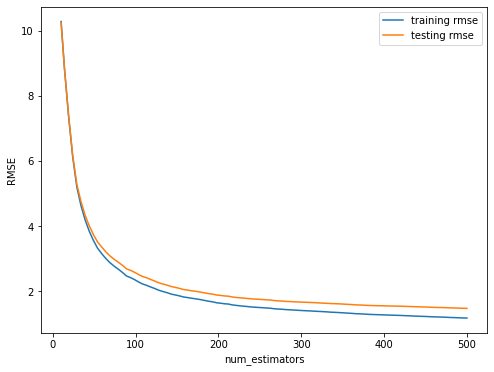

In [11]:
import lightgbm as lgb
from catboost import Pool, CatBoostRegressor
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


# Video transcoding time dataset
video_df = pd.read_csv('./online_video_dataset/transcoding_mesurment.tsv',sep='\t')

category_features = ['width','height','o_width','o_height','codec','o_codec']
numerical_features = ['duration','bitrate','frames','framerate',
                      'i','p','b','i_size','p_size','size',
                      'o_bitrate','o_framerate']
video_features = numerical_features + category_features 
# Standardize numerical features and encode categorical features with integers
# Note that we do not manually perform one hot encoding (like for linear/polynomial regression)! 
video_preprocessing_pipeline = ColumnTransformer([
    ('numerical', StandardScaler(), numerical_features),
    ('category', OrdinalEncoder(), category_features),
])
X_video = video_preprocessing_pipeline.fit_transform(video_df[video_features])
y_video = video_df["utime"].values # total count 
X_train, X_test, y_train, y_test = train_test_split(X_video, y_video, test_size = 0.2,  random_state = 42)

n_samples = 100
n_est_num= np.linspace(10,500,num=n_samples,dtype='int')

train_rmse = np.zeros(n_samples)
test_rmse = np.zeros(n_samples)

for i,n_est in enumerate(n_est_num):
    lgbm=lgb.LGBMRegressor(feature_fraction=0.8741572946130213, learning_rate=0.05611422000253982, max_bin=813, 
                       min_child_samples=108, n_estimators=n_est,num_leaves=131, reg_alpha=0.66053564351823,
                       reg_lambda=6.032260696731284e-06, subsample=0.8537790245221506, subsample_freq=4, max_depth=20)
    lgbm.fit(X_train, y_train)
    # rfd_pred = cross_val_predict(lgbm, X_train, X_test, cv = 5)
    pred1 =  lgbm.predict(X_train)
    train_rmse[i]=np.sqrt(mean_squared_error(y_train, pred1))
    pred2 =  lgbm.predict(X_test)
    test_rmse[i]=np.sqrt(mean_squared_error(y_test, pred2))
    print(f'Number of estimators: {n_est}, Train RMSE: {train_rmse[i]}, Test RMSE: {test_rmse[i]}')

plt.figure(figsize=(8, 6)) 
plt.plot(n_est_num,train_rmse,label="training rmse")
plt.plot(n_est_num,test_rmse,label="testing rmse")
plt.xlabel('num_estimators')
plt.ylabel('RMSE')
plt.legend(loc = 'best')
plt.savefig(f'./figures/lgbm-02.png')
plt.show()

## Evaluation

Random Forest

In [ ]:
#RF ON BIKE
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error as mse
import math

kf = KFold(n_splits=10)
kf.get_n_splits(X_bike_best)
print(kf)

rf = RandomForestRegressor(n_estimators = 50, max_features=4, max_depth=15, random_state = 42, oob_score=True)

RMSE_train=[]
RMSE_test=[]

for train_index, test_index in kf.split(X_bike_best):       
    X_train, X_test = X_bike_best[train_index], X_bike_best[test_index]
    y_train, y_test = y_bike[train_index], y_bike[test_index]

    rf.fit(X_train, y_train)
        
    predicted_test = rf.predict(X_test)
    RMSE_test.append(mse(y_test, predicted_test))

    predicted_train = rf.predict(X_train)
    RMSE_train.append(mse(y_train, predicted_train))

print("Random Forest Model on the Bike Dataset:")
print("Out of bag score =",round(1-rf.oob_score_,5))
print("Mean training RMSE=", round(math.sqrt(np.mean(RMSE_train)),5))
print("Mean testing RMSE=", round(math.sqrt(np.mean(RMSE_test)),5))

KFold(n_splits=10, random_state=None, shuffle=False)
Random Forest Model on the Bike Dataset:
Out of bag score = 0.10765
Mean training RMSE= 264.35602
Mean testing RMSE= 856.6994


In [ ]:
#RF ON SUICIDE
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error as mse
import math

kf = KFold(n_splits=10)
kf.get_n_splits(X_suicide_best)
print(kf)

rf = RandomForestRegressor(n_estimators = 47, max_features=4, max_depth=8, random_state = 42, oob_score=True)

RMSE_train=[]
RMSE_test=[]

for train_index, test_index in kf.split(X_suicide_best):       
    X_train, X_test = X_suicide_best[train_index], X_suicide_best[test_index]
    y_train, y_test = y_suicide[train_index], y_suicide[test_index]

    rf.fit(X_train, y_train)
        
    predicted_test = rf.predict(X_test)
    RMSE_test.append(mse(y_test, predicted_test))

    predicted_train = rf.predict(X_train)
    RMSE_train.append(mse(y_train, predicted_train))

print("Random Forest Model on the Suicide Dataset:")
print("Out of bag score =",round(1-rf.oob_score_,5))
print("Mean training RMSE=", round(math.sqrt(np.mean(RMSE_train)),5))
print("Mean testing RMSE=", round(math.sqrt(np.mean(RMSE_test)),5))

KFold(n_splits=10, random_state=None, shuffle=False)
Random Forest Model on the Suicide Dataset:
Out of bag score = 0.48747
Mean training RMSE= 13.08927
Mean testing RMSE= 14.30988


In [ ]:
#RF ON VIDEO
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error as mse
import math

kf = KFold(n_splits=10)
kf.get_n_splits(X_video_best)
print(kf)

rf = RandomForestRegressor(n_estimators = 20, max_features=8, max_depth=20, random_state = 42, oob_score=True)

RMSE_train=[]
RMSE_test=[]

for train_index, test_index in kf.split(X_video_best):       
    X_train, X_test = X_video_best[train_index], X_video_best[test_index]
    y_train, y_test = y_video[train_index], y_video[test_index]

    rf.fit(X_train, y_train)
        
    predicted_test = rf.predict(X_test)
    RMSE_test.append(mse(y_test, predicted_test))

    predicted_train = rf.predict(X_train)
    RMSE_train.append(mse(y_train, predicted_train))

print("Random Forest Model on the Video Dataset:")
print("Out of bag score =",round(1-rf.oob_score_,5))
print("Mean training RMSE=", round(math.sqrt(np.mean(RMSE_train)),5))
print("Mean testing RMSE=", round(math.sqrt(np.mean(RMSE_test)),5))

KFold(n_splits=10, random_state=None, shuffle=False)


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


Random Forest Model on the Video Dataset:
Out of bag score = 0.00883
Mean training RMSE= 0.65164
Mean testing RMSE= 4.3635


In [ ]:
#LGBM ON VIDEO
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error as mse
import math

kf = KFold(n_splits=10)
kf.get_n_splits(X_video_best)
print(kf)

rf = RandomForestRegressor(n_estimators = 20, max_features=8, max_depth=20, random_state = 42, oob_score=True)

RMSE_train=[]
RMSE_test=[]

for train_index, test_index in kf.split(X_video_best):       
    X_train, X_test = X_video_best[train_index], X_video_best[test_index]
    y_train, y_test = y_video[train_index], y_video[test_index]

    rf.fit(X_train, y_train)
        
    predicted_test = rf.predict(X_test)
    RMSE_test.append(mse(y_test, predicted_test))

    predicted_train = rf.predict(X_train)
    RMSE_train.append(mse(y_train, predicted_train))

print("Random Forest Model on the Video Dataset:")
print("Out of bag score =",round(1-rf.oob_score_,5))
print("Mean training RMSE=", round(math.sqrt(np.mean(RMSE_train)),5))
print("Mean testing RMSE=", round(math.sqrt(np.mean(RMSE_test)),5))

In [ ]:
import lightgbm as lgb
from catboost import Pool, CatBoostRegressor

# Video transcoding time dataset
video_df = pd.read_csv('./online_video_dataset/transcoding_mesurment.tsv',sep='\t')

category_features = ['width','height','o_width','o_height','codec','o_codec']
numerical_features = ['duration','bitrate','frames','framerate',
                      'i','p','b','i_size','p_size','size',
                      'o_bitrate','o_framerate']
video_features = numerical_features + category_features 
# Standardize numerical features and encode categorical features with integers
# Note that we do not manually perform one hot encoding (like for linear/polynomial regression)! 
video_preprocessing_pipeline = ColumnTransformer([
    ('numerical', StandardScaler(), numerical_features),
    ('category', OrdinalEncoder(), category_features),
])
X_video = video_preprocessing_pipeline.fit_transform(video_df[video_features])
y_video = video_df["utime"].values # total count 

lgbm=lgb.LGBMRegressor(feature_fraction=0.8741572946130213, learning_rate=0.05611422000253982, max_bin=813, 
                       min_child_samples=108, min_child_weight=10, n_estimators=468,num_leaves=131, reg_alpha=0.66053564351823,
                       reg_lambda=6.032260696731284e-06, subsample=0.8537790245221506, subsample_freq=4)

from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error as mse
import math

kf = KFold(n_splits=10)
kf.get_n_splits(X_video)
print(kf)

RMSE_train=[]
RMSE_test=[]

for train_index, test_index in kf.split(X_video):       
    X_train, X_test = X_video[train_index], X_video[test_index]
    y_train, y_test = y_video[train_index], y_video[test_index]

    lgbm.fit(X_train, y_train)
        
    predicted_test = lgbm.predict(X_test)
    RMSE_test.append(mse(y_test, predicted_test))

    predicted_train = lgbm.predict(X_train)
    RMSE_train.append(mse(y_train, predicted_train))

print("LightGBM on the Video Dataset:")
print("Mean training RMSE=", round(math.sqrt(np.mean(RMSE_train)),5))
print("Mean testing RMSE=", round(math.sqrt(np.mean(RMSE_test)),5))

KFold(n_splits=10, random_state=None, shuffle=False)


In [ ]:

catBoost=CatBoostRegressor(verbose=False,bagging_temperature=0.7205838857301069, border_count=76,
                                           depth= 7,  l2_leaf_reg=7.968962608105025, 
                                           learning_rate=0.07151237682817713, n_estimators=715, random_strength = 0.0031447004292208427)

RMSE_train=[]
RMSE_test=[]

for train_index, test_index in kf.split(X_video):       
    X_train, X_test = X_video[train_index], X_video[test_index]
    y_train, y_test = y_video[train_index], y_video[test_index]

    catBoost.fit(X_train, y_train)
        
    predicted_test = catBoost.predict(X_test)
    RMSE_test.append(mse(y_test, predicted_test))

    predicted_train = catBoost.predict(X_train)
    RMSE_train.append(mse(y_train, predicted_train))

print("LightGBM on the Video Dataset:")
print("Mean training RMSE=", round(math.sqrt(np.mean(RMSE_train)),5))
print("Mean testing RMSE=", round(math.sqrt(np.mean(RMSE_test)),5))

LightGBM on the Video Dataset:
Mean training RMSE= 1.45461
Mean testing RMSE= 3.97054
